## Wasserstein Generative Adversarial Network (WGAN)

The Wasserstein Generative Adversarial Network (WGAN) is a variant of the traditional Generative Adversarial Network (GAN) designed to address issues related to training stability and mode collapse. Key characteristics of WGAN include:

### Wasserstein Distance:
- WGAN introduces the Wasserstein distance (also known as Earth Mover's Distance or 1-Lipschitz continuity) as a metric for training stability.
- Unlike traditional GANs, WGAN encourages the critic to provide a smooth and meaningful score distribution for generated and real samples.

### Lipschitz Continuity:
- To enforce the Lipschitz continuity required for the Wasserstein distance, a gradient penalty term is introduced.
- The gradient penalty penalizes the critic for having gradients with a norm significantly different from 1.

### Training Loop:
- The training loop involves multiple updates to the critic before updating the generator.
- Gradients are calculated, and the gradient penalty is applied to ensure a smooth learning landscape.

### Training Visualization:
- The provided code demonstrates the training loop for a WGAN, tracking the average losses of both the generator and the critic over epochs.
- Visualization includes generated and real images.

In [1]:
import torch
from torch import nn
from tqdm.auto import tqdm
from torchvision import transforms
from torchvision.datasets import MNIST
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
import matplotlib.pyplot as plt
torch.manual_seed(0)

## Image Visualization Function

This function is designed to visually display a grid of images given an input tensor of images. It is particularly useful for visualizing real or generated images during the training of a Generative Adversarial Network (GAN).

### Parameters:
- **image_tensor:** Input tensor of images to be visualized.
- **num_images:** Number of images to be displayed in the grid (default is 25).
- **size:** Size of each image (default is (1, 28, 28) for a 28x28 image with 1 channel).
- **generated:** A flag to determine if the images are generated (default is False).


### Steps:
1. **Preprocessing:**
   - Ensure the input tensor is normalized, detached, moved to CPU..

2. **Grid Arrangement:**
   - Arrange images in a grid using the `make_grid` function, displaying 'num_images' with 5 images per row.

3. **Display:**
   - Display the image grid using matplotlib.
   - Set the title based on the 'generated' flag.
   - Turn off axes to display images only.

4. **Show Image Grid:**
   - Show the image grid using `plt.show()`.

In [2]:
def show_tensor_images(image_tensor, num_images=25, size=(1, 28, 28), generated=False):
    '''
    Function for visualizing images in a uniform grid.

    Parameters:
    - image_tensor: Input tensor of images to be visualized.
    - num_images: Number of images to be displayed in the grid (default is 25).
    - size: Size of each image (default is (1, 28, 28) for a 28x28 image with 1 channel).
    - generated: A flag to determine if the images are generated (default is False).

    Comments:
    - The function scales the pixel values of the input tensor to the range [0, 1] for visualization.
    - It then detaches the tensor, moves it to the CPU, and reshapes it for display.
    - The images are arranged in a grid using the make_grid function, with 'num_images' displayed in 5 images per row.
    - The resulting image grid is shown using matplotlib.
    '''
    # Scale pixel values to the range [0, 1]
    image_tensor = (image_tensor + 1) / 2

    # Ensure the tensor is detached, moved to CPU, and reshaped for visualization
    image_unflat = image_tensor.detach().cpu()

    # Arrange images in a grid using the make_grid function, displaying 'num_images' with 5 images per row
    image_grid = make_grid(image_unflat[:num_images], nrow=5)

    # Display the image grid using matplotlib
    plt.imshow(image_grid.permute(1, 2, 0).squeeze())
    
    # Set title based on the 'generated' flag
    if generated:
        plt.title("Generated Images")
    else:
        plt.title("Real Images")
        
    # Turn off axis to display images only
    plt.axis(False)

    # Show the image grid
    plt.show()

In [3]:
def make_grad_hook():
    '''
    Function to keep track of gradients for visualization purposes, 
    which fills the grads list when using model.apply(grad_hook).
    Returns:
        grads: List to store gradients
        grad_hook: Hook function to be used with model.apply(grad_hook)
    '''
    grads = []
    def grad_hook(m):
        '''
        Hook function to be used with model.apply(grad_hook).
        Appends the gradient of convolutional layers to the grads list.
        Parameters:
            m: Module in the neural network
        '''
        if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
            grads.append(m.weight.grad)
    return grads, grad_hook

## Generator for Generative Adversarial Network (WGAN-GP)

The `Generator` class represents the generator component of a Deep Convolutional Generative Adversarial Network (DCGAN). It takes random noise as input and generates synthetic images.

Here's an overview of the key components:

### Architecture:
- The generator consists of a series of generator blocks, each composed of a transposed convolutional layer, batch normalization, and ReLU activation.
- The number of hidden layers and their dimensions are determined by the `hidden_dim` parameter.
- The final layer is a transposed convolutional layer followed by a hyperbolic tangent (Tanh) activation. Tanh is used to squash the output to the range [-1, 1].

### Initialization:
- The `__init__` method initializes the generator with default or user-specified dimensions for the input noise vector (`z_dim`), output image (`im_chan`), and hidden layers (`hidden_dim`).
- The `make_gen_block` method creates a generator block with a transposed convolutional layer, batch normalization, and ReLU activation.

### Forward Pass:
- The `forward` method defines the forward pass of the generator, taking a noise tensor as input and producing generated images.
- The input noise tensor is reshaped and passed through the sequential blocks defined in the constructor.

### Example usage
generator = Generator(z_dim=100, im_chan=1, hidden_dim=64)
noise_vector = torch.randn((batch_size, 100))  # Generate random noise
generated_images = generator(noise_vector)

In [4]:
class Generator(nn.Module):
    '''
    Generator Class
    Values:
        z_dim: the dimension of the noise vector, a scalar
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, z_dim=10, im_chan=1, hidden_dim=64):
        super(Generator, self).__init__()
        self.z_dim = z_dim
        # Build the neural network
        self.gen = nn.Sequential(
            self.make_gen_block(z_dim, hidden_dim * 4),
            self.make_gen_block(hidden_dim * 4, hidden_dim * 2, kernel_size=4, stride=1),
            self.make_gen_block(hidden_dim * 2, hidden_dim),
            self.make_gen_block(hidden_dim, im_chan, kernel_size=4, final_layer=True),
        )

    def make_gen_block(self, input_channels, output_channels, kernel_size=3, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a generator block of DCGAN, 
        corresponding to a transposed convolution, a batchnorm (except for in the last layer), and an activation.
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        # Build the neural block
        if not final_layer:
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size=kernel_size, stride=stride),
                nn.BatchNorm2d(output_channels),
                nn.ReLU(inplace=True)  # Use ReLU activation for non-linearity
            )
        else:  # Final Layer
            return nn.Sequential(
                nn.ConvTranspose2d(input_channels, output_channels, kernel_size, stride),
                nn.Tanh()  # Use Tanh activation for the final layer to squash the output to the range [-1, 1]
            )

    def forward(self, noise):
        '''
        Function for completing a forward pass of the generator: Given a noise tensor, 
        returns generated images.
        Parameters:
            noise: a noise tensor with dimensions (n_samples, z_dim)
        '''
        noise = noise.view(len(noise), self.z_dim, 1, 1)
        return self.gen(noise)

## Generating Random Noise for GAN

This function, `get_noise`, serves the purpose of creating random noise vectors, typically used as input for the generator in a GAN. The generated noise vectors are crucial for the GAN training process as they provide the variability necessary for the generator to produce diverse synthetic samples.

### Parameters:
- `n_samples`: The number of noise samples to generate.
- `z_dim`: The dimension of the noise vector.
- `device`: The device where the generated tensor will be allocated, with the default being 'cpu'.

### Example usage
noise = get_noise(n_samples=100, z_dim=64, device='cuda')

In [5]:
def get_noise(n_samples, z_dim, device='cpu'):
    '''
    Function to generate random noise for a GAN.

    Parameters:
    - n_samples: The number of noise samples to generate.
    - z_dim: The dimension of the noise vector.
    - device: The device where the tensor will be allocated (default is 'cpu').

    Returns:
    - Random noise tensor with dimensions [n_samples, z_dim] on the specified device.
    '''
    # Generate random noise of shape (n_samples, z_dim) from a normal distribution
    # and allocate it to the specified device (CPU or GPU)
    return torch.randn(n_samples, z_dim).to(device)

## Critic for Generative Adversarial Network (WGAN-GP)

The `Critic` class represents the discriminator component of a Deep Convolutional Generative Adversarial Network (DCGAN). It evaluates input images and classifies them as fake or real.

Here's an overview of the key components:

### Architecture:
- The discriminator consists of a series of discriminator blocks, each composed of a convolutional layer, batch normalization, and LeakyReLU activation.
- The number of hidden layers and their dimensions are determined by the `hidden_dim` parameter.
- The final layer is a convolutional layer without batch normalization.

### Initialization:
- The `__init__` method initializes the discriminator with default or user-specified dimensions for the input image (`im_chan`) and hidden layers (`hidden_dim`).
- The `make_disc_block` method creates a discriminator block with a convolutional layer, batch normalization, and LeakyReLU activation.

### Forward Pass:
- The `forward` method defines the forward pass of the discriminator, taking an image tensor as input and producing a 1-dimensional tensor representing fake or real.

### Example usage
discriminator = Discriminator(im_chan=1, hidden_dim=16)
image_tensor = torch.randn((batch_size, 1, 28, 28))  # Generate random image tensor
discriminator_output = discriminator(image_tensor)

In [6]:
class Critic(nn.Module):
    '''
    Critic Class
    Values:
        im_chan: the number of channels in the images, fitted for the dataset used, a scalar
              (MNIST is black-and-white, so 1 channel is your default)
        hidden_dim: the inner dimension, a scalar
    '''
    def __init__(self, im_chan=1, hidden_dim=64):
        super(Critic, self).__init__()
        self.crit = nn.Sequential(
            self.make_crit_block(im_chan, hidden_dim),
            self.make_crit_block(hidden_dim, hidden_dim * 2),
            self.make_crit_block(hidden_dim * 2, 1, final_layer=True),
        )

    def make_crit_block(self, input_channels, output_channels, kernel_size=4, stride=2, final_layer=False):
        '''
        Function to return a sequence of operations corresponding to a critic block of DCGAN;
        a convolution, a batchnorm (except in the final layer), and an activation (except in the final layer).
        Parameters:
            input_channels: how many channels the input feature representation has
            output_channels: how many channels the output feature representation should have
            kernel_size: the size of each convolutional filter, equivalent to (kernel_size, kernel_size)
            stride: the stride of the convolution
            final_layer: a boolean, true if it is the final layer and false otherwise 
                      (affects activation and batchnorm)
        '''
        if not final_layer:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
                nn.BatchNorm2d(output_channels),
                nn.LeakyReLU(0.2, inplace=True),  # Use LeakyReLU activation for non-linearity
            )
        else:
            return nn.Sequential(
                nn.Conv2d(input_channels, output_channels, kernel_size, stride),
            )

    def forward(self, image):
        '''
        Function for completing a forward pass of the critic: Given an image tensor, 
        returns a 1-dimension tensor representing fake/real.
        Parameters:
            image: a flattened image tensor with dimension (im_chan)
        '''
        crit_pred = self.crit(image)
        return crit_pred.view(len(crit_pred), -1)

## Training Configuration for Generative Adversarial Network (GAN)

This section outlines the configuration parameters and setup for training a Generative Adversarial Network (GAN) using the MNIST dataset.

### Criterion:
- Binary Cross Entropy with Logits Loss (BCEWithLogitsLoss) is selected as the loss function for both the generator and discriminator.

### Generator Configuration:
- The dimension of the input noise vector for the generator (`z_dim`) is set to 64.

### Training Parameters:
- `display_step`: The frequency for displaying intermediate results during training is set to 500 steps.
- `batch_size`: The batch size for the dataset is configured to be 128.

### Optimizer Parameters:
- Learning rate (`lr`): The learning rate for the Adam optimizer is set to 0.0002.
- Adam optimizer hyperparameters:
  - `beta_1`: Exponential decay rate for the first moment estimate, configured to 0.5.
  - `beta_2`: Exponential decay rate for the second moment estimate, configured to 0.999.

### Device:
- The device for computation is determined based on GPU availability. If available, 'cuda' is selected; otherwise, 'cpu' is the default.

### Image Transformations:
- Image transformations include converting the image to a PyTorch tensor and normalizing tensor values to be in the range [-1, 1] using the tanh activation function.

### DataLoader Setup:
- DataLoader is set up for the MNIST dataset with the specified transformations, batch size, and shuffle option.

In [7]:
# Number of training epochs
n_epochs = 100

# Dimension of the input noise vector for the generator
z_dim = 64

# Frequency for displaying intermediate results during training
display_step = 500

# Batch size for the dataset
batch_size = 128

# Learning rate for the optimizers
lr = 0.0002

# Adam optimizer hyperparameters
beta_1 = 0.5  # Exponential decay rate for the first moment estimate
beta_2 = 0.999  # Exponential decay rate for the second moment estimate

# Regularization parameter for the WGAN-GP gradient penalty
c_lambda = 10

# Number of times the critic is updated per generator update
crit_repeats = 5

# Determine and set the device for computation
# Check for GPU availability; use 'cuda' if available, otherwise default to 'cpu'
device = 'cuda'

# Image transformations for normalization
# Transform the image values to be between -1 and 1 (the range of the tanh activation)
transform = transforms.Compose([
    transforms.ToTensor(),  # Convert the image to a PyTorch tensor
    transforms.Normalize((0.5,), (0.5,)),  # Normalize the tensor values to be in the range [-1, 1]
])

# DataLoader setup for MNIST dataset, downloading if necessary, transforming to tensors
dataloader = DataLoader(
    MNIST('.', download=False, transform=transform),
    batch_size=batch_size,
    shuffle=True
)

## GAN Model and Optimizer Instantiation

In [8]:
# Instantiate Generator and Critic models
gen = Generator(z_dim).to(device)
gen_opt = torch.optim.Adam(gen.parameters(), lr=lr, betas=(beta_1, beta_2))
crit = Critic().to(device) 
crit_opt = torch.optim.Adam(crit.parameters(), lr=lr, betas=(beta_1, beta_2))

# Weight Initialization Function
def weights_init(m):
    '''
    Function to initialize the weights of convolutional and batch normalization layers.

    Parameters:
        m: A module in the neural network.

    Note:
        - Convolutional layers and BatchNormalization layers have their weights initialized.
        - Weights are initialized from a normal distribution with mean 0 and standard deviation 0.02.
        - BatchNormalization biases are initialized to zero.
    '''
    if isinstance(m, nn.Conv2d) or isinstance(m, nn.ConvTranspose2d):
        # Initialize convolutional layer weights
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
    if isinstance(m, nn.BatchNorm2d):
        # Initialize BatchNormalization layer weights and biases
        torch.nn.init.normal_(m.weight, 0.0, 0.02)
        torch.nn.init.constant_(m.bias, 0)

# Apply weight initialization to Generator and Discriminator
gen = gen.apply(weights_init)
crit = crit.apply(weights_init)

## Get Gradient Function

The `get_gradient` function calculates the gradient of the critic's scores with respect to mixes of real and fake images. This is an essential step in computing the gradient penalty for Wasserstein GANs.

### Parameters:
- **crit**: The critic model.
- **real**: A batch of real images.
- **fake**: A batch of fake images.
- **epsilon**: A vector of uniformly random proportions of real/fake per mixed image.

### Returns:
- **gradient**: The gradient of the critic's scores with respect to the mixed image.

### Steps:
1. Mixes the real and fake images using the given epsilon.
2. Calculates the critic's scores on the mixed images.
3. Computes the gradient of the scores with respect to the mixed images using PyTorch's autograd.
4. Returns the computed gradient.

This function is used in the context of Wasserstein GANs to enforce a gradient penalty, contributing to the stability of the training process.

In [9]:
def get_gradient(crit, real, fake, epsilon):
    '''
    Return the gradient of the critic's scores with respect to mixes of real and fake images.
    
    Parameters:
        crit: the critic model
        real: a batch of real images
        fake: a batch of fake images
        epsilon: a vector of the uniformly random proportions of real/fake per mixed image
    
    Returns:
        gradient: the gradient of the critic's scores, with respect to the mixed image
    '''
    # Mix the images together
    mixed_images = real * epsilon + fake * (1 - epsilon)

    # Calculate the critic's scores on the mixed images
    mixed_scores = crit(mixed_images)
    
    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=mixed_images,
        outputs=mixed_scores,
        # These other parameters have to do with the pytorch autograd engine works
        grad_outputs=torch.ones_like(mixed_scores), 
        create_graph=True,
        retain_graph=True,
    )[0]
    return gradient

## Gradient Penalty Function

The `gradient_penalty` function calculates the gradient penalty given a gradient. In the context of Wasserstein GANs, this penalty is crucial for stabilizing the training process and ensuring that the Wasserstein distance is enforced.

### Parameters:
- **gradient**: The gradient of the critic's scores with respect to the mixed image.

### Returns:
- **penalty**: The gradient penalty.

### How it works:
1. Flattens the gradients so that each row captures one image.
2. Calculates the magnitude of every row using the L2 norm.
3. Penalizes the mean squared distance of the gradient norms from 1.

This penalty encourages the gradient of the critic to have a magnitude close to 1, which helps prevent mode collapse and other training instabilities.

In [10]:
def gradient_penalty(gradient):
    '''
    Return the gradient penalty, given a gradient.

    Given a batch of image gradients, you calculate the magnitude of each image's gradient
    and penalize the mean quadratic distance of each magnitude to 1.

    Parameters:
        gradient: the gradient of the critic's scores, with respect to the mixed image

    Returns:
        penalty: the gradient penalty
    '''
    # Flatten the gradients so that each row captures one image
    gradient = gradient.view(len(gradient), -1)

    # Calculate the magnitude of every row
    gradient_norm = gradient.norm(2, dim=1)
    
    # Penalize the mean squared distance of the gradient norms from 1
    penalty = ((gradient_norm - 1) ** 2).mean()
    return penalty

## Generator Loss Calculation

The `get_gen_loss` function computes the loss of a generator based on the critic's scores of the generator's fake images. This loss is a crucial component of training a GAN, as it guides the generator to produce more realistic images.

### Parameters:
- **crit_fake_pred**: The critic's scores of the fake images generated by the generator.

### Returns:
- **gen_loss**: A scalar loss value for the current batch of the generator.

### How it works:
The generator loss is calculated as the negative mean of the critic's scores for the generated fake images. This formulation encourages the generator to produce images that the critic would classify as real, ultimately improving the overall quality of the generated images.

In [11]:
def get_gen_loss(crit_fake_pred):
    '''
    Return the loss of a generator given the critic's scores of the generator's fake images.

    Parameters:
        crit_fake_pred: the critic's scores of the fake images

    Returns:
        gen_loss: a scalar loss value for the current batch of the generator
    '''
    gen_loss = -crit_fake_pred.mean()
    return gen_loss

## Critic Loss Calculation

The `get_crit_loss` function computes the loss of a critic based on its scores for both fake and real images, incorporating the gradient penalty and its weight.

### Parameters:
- **crit_fake_pred**: The critic's scores for the fake images generated by the generator.
- **crit_real_pred**: The critic's scores for real images from the dataset.
- **gp**: The unweighted gradient penalty.
- **c_lambda**: The current weight of the gradient penalty.

### Returns:
- **crit_loss**: A scalar representing the critic's loss, accounting for the relevant factors.

### How it works:
The critic loss is calculated as the difference between the mean scores for fake and real images, adjusted by the gradient penalty term. The gradient penalty is added to enforce the Lipschitz constraint on the critic, preventing it from becoming too powerful and destabilizing the training of the generator. The weight `c_lambda` controls the influence of the gradient penalty in the overall critic loss.

In [12]:
def get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda):
    '''
    Return the loss of a critic given the critic's scores for fake and real images,
    the gradient penalty, and gradient penalty weight.

    Parameters:
        crit_fake_pred: the critic's scores of the fake images
        crit_real_pred: the critic's scores of the real images
        gp: the unweighted gradient penalty
        c_lambda: the current weight of the gradient penalty 

    Returns:
        crit_loss: a scalar for the critic's loss, accounting for the relevant factors
    '''
    crit_loss = (crit_fake_pred.mean() - crit_real_pred.mean()) + c_lambda * gp
    return crit_loss

## Wasserstein GAN Training Loop

The provided code represents the training loop for a Wasserstein Generative Adversarial Network (WGAN). Here's a breakdown of the key components:

### Training Epochs and Batches:
- The outer loop iterates over training epochs (`n_epochs`).
- The inner loop processes batches of real images from the dataloader.

### Critic Training:
- The critic is updated multiple times (`crit_repeats`) before updating the generator.
- For each critic update, gradients are calculated, and the gradient penalty is used to enforce Lipschitz continuity.
- The average critic loss for each iteration within an epoch is tracked.

### Generator Training:
- After updating the critic, the generator is updated once based on the critic's scores for generated images.
- The average generator loss for each iteration within an epoch is tracked.

### Visualization:
- Intermediate results are displayed at regular intervals (`display_step`).
- Generated and real images are shown.

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 500: Generator loss: 5.338700582686344, critic loss: -95.51569109170435


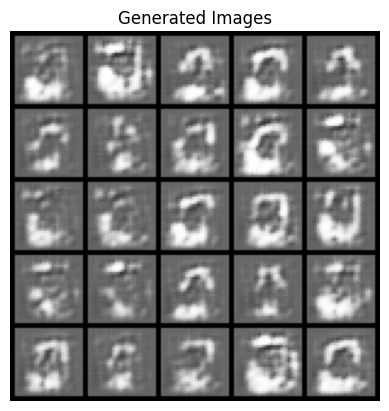

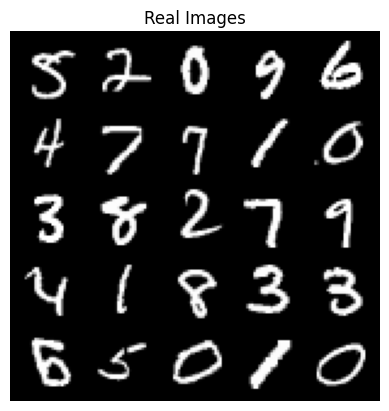

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1000: Generator loss: -0.8546212597489364, critic loss: -253.0104431991578


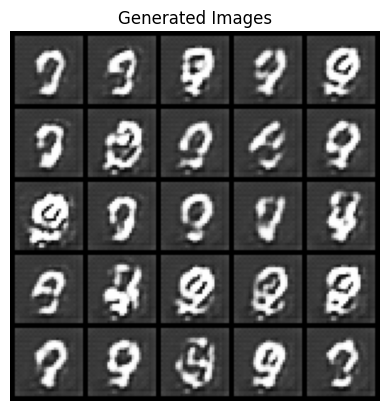

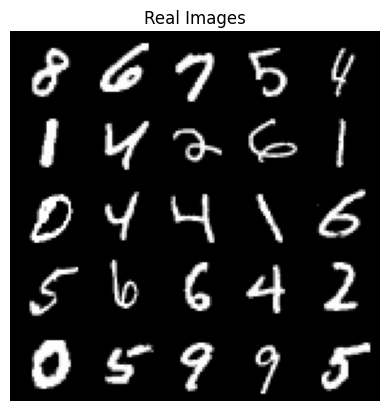

  0%|          | 0/469 [00:00<?, ?it/s]

Step 1500: Generator loss: -0.9518426320403808, critic loss: -9.23924031534195


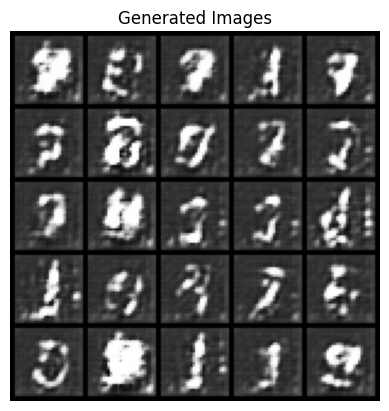

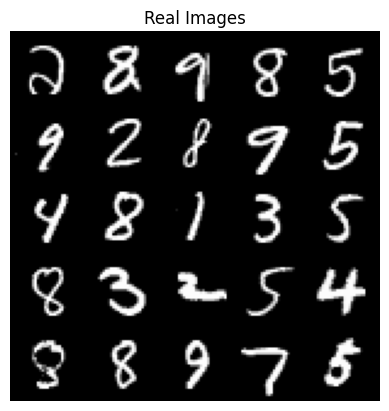

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2000: Generator loss: -7.1161911480426845, critic loss: 4.810021172142029


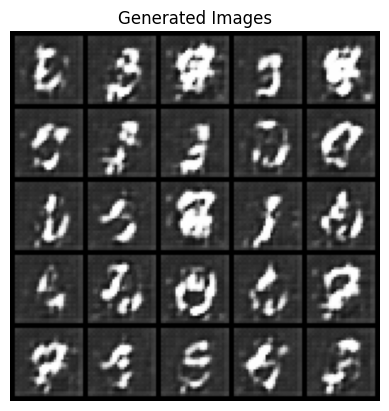

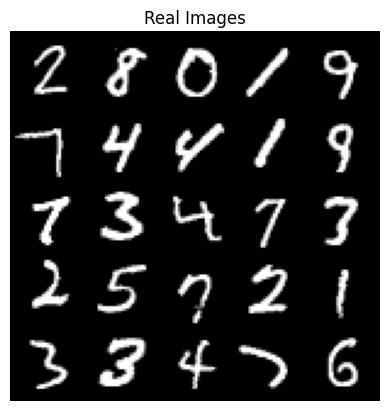

  0%|          | 0/469 [00:00<?, ?it/s]

Step 2500: Generator loss: -8.65099235734344, critic loss: -13.444342444419865


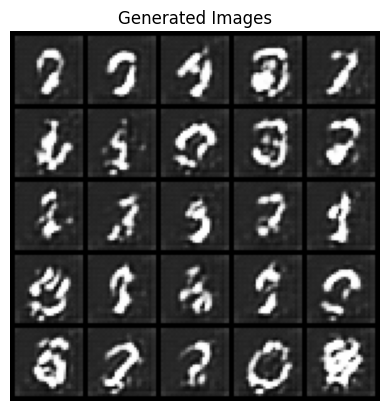

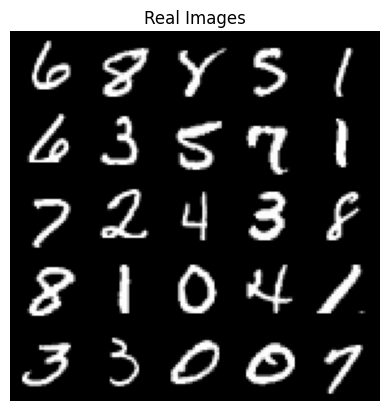

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3000: Generator loss: -7.814387257091698, critic loss: -15.292719626808164


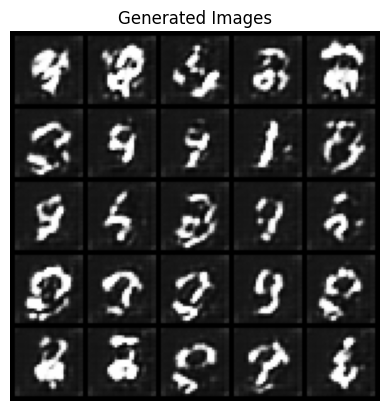

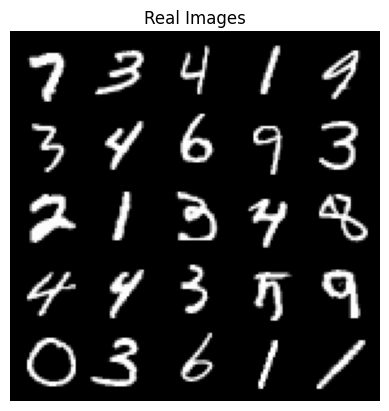

  0%|          | 0/469 [00:00<?, ?it/s]

Step 3500: Generator loss: -6.058495930459352, critic loss: -9.183127228021624


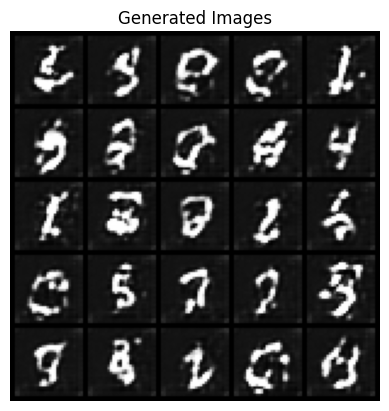

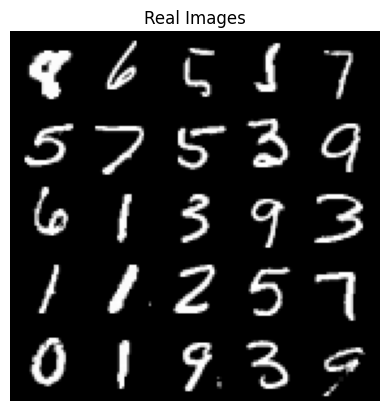

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4000: Generator loss: -0.7525201827585686, critic loss: -9.959601084613798


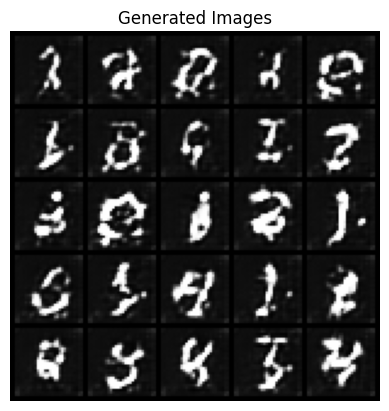

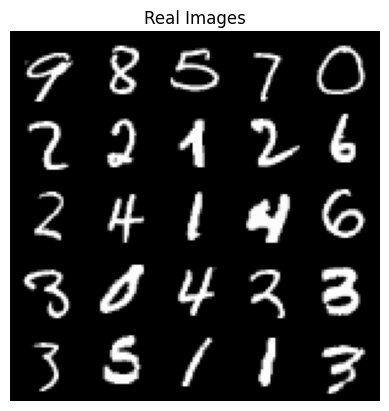

  0%|          | 0/469 [00:00<?, ?it/s]

Step 4500: Generator loss: -3.0035437719002376, critic loss: -6.624202128195764


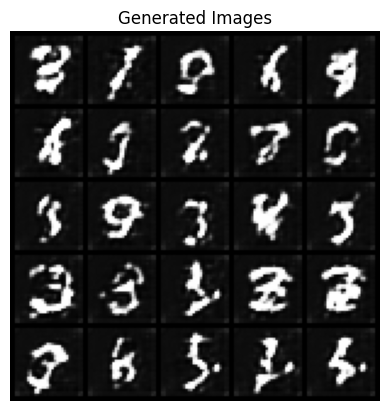

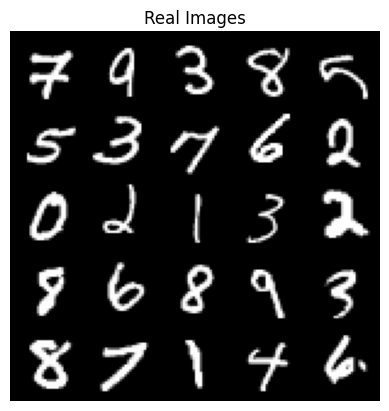

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5000: Generator loss: -3.7971067704781847, critic loss: -7.933977705955513


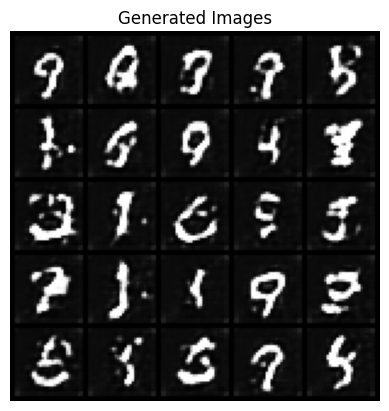

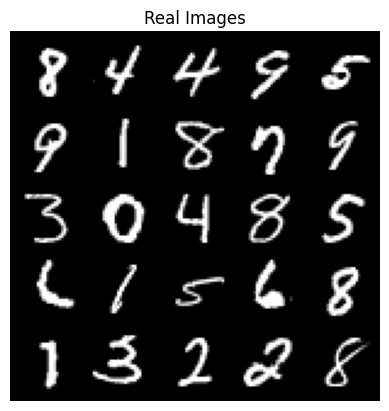

  0%|          | 0/469 [00:00<?, ?it/s]

Step 5500: Generator loss: -4.41203579886257, critic loss: -10.86692523016929


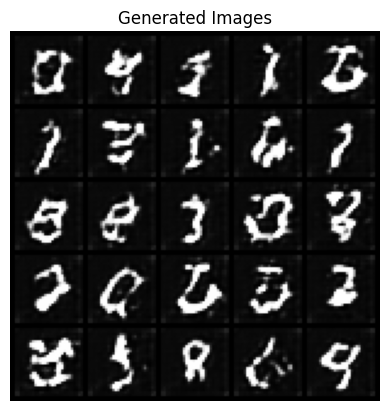

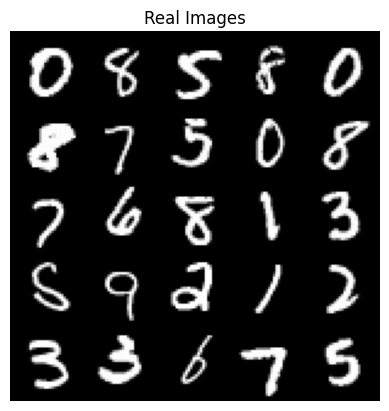

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6000: Generator loss: -2.210875613495711, critic loss: -10.69510197465419


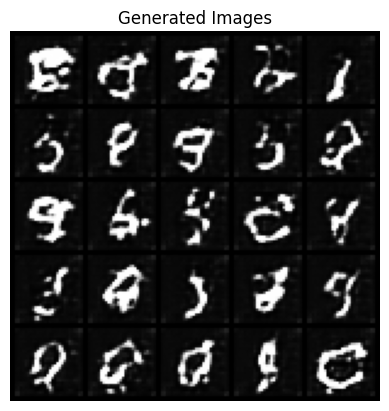

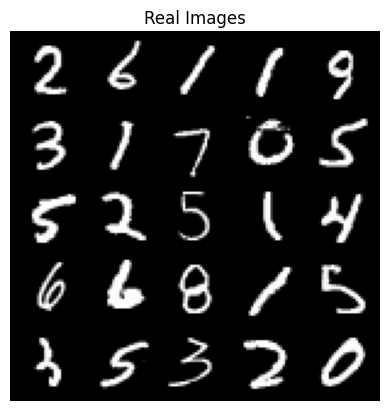

  0%|          | 0/469 [00:00<?, ?it/s]

Step 6500: Generator loss: -2.4206919655911636, critic loss: -8.062373680329316


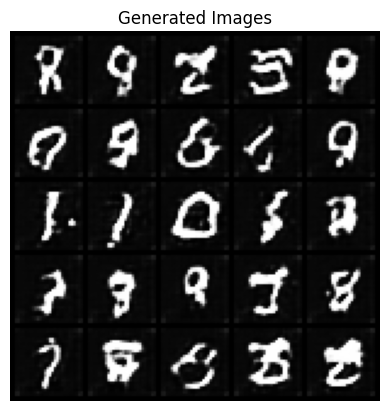

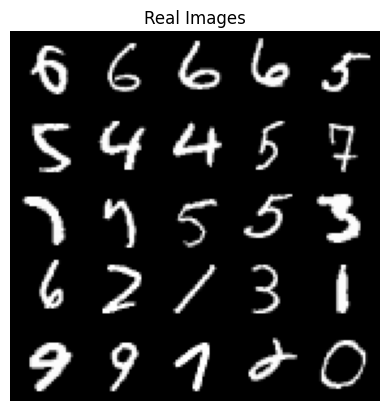

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7000: Generator loss: -4.76219544263184, critic loss: -13.321394808459276


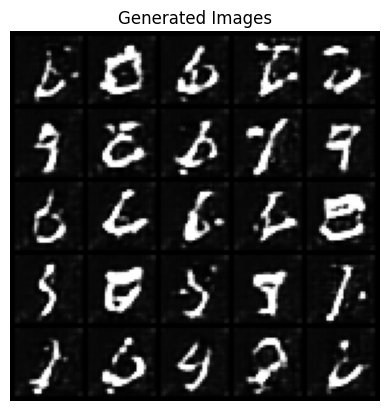

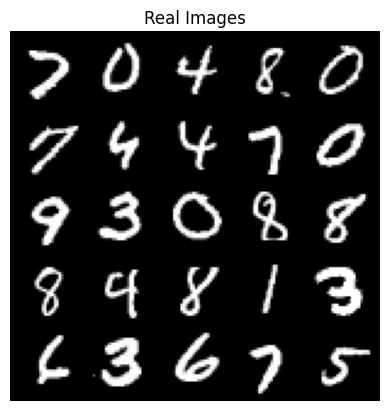

  0%|          | 0/469 [00:00<?, ?it/s]

Step 7500: Generator loss: -5.726552908912302, critic loss: -12.678942295384404


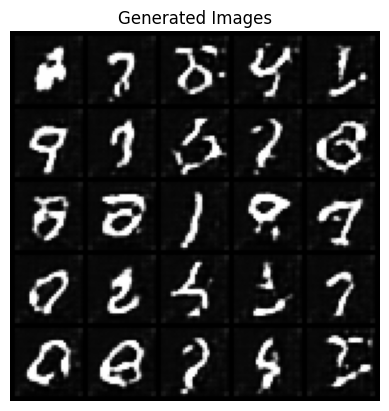

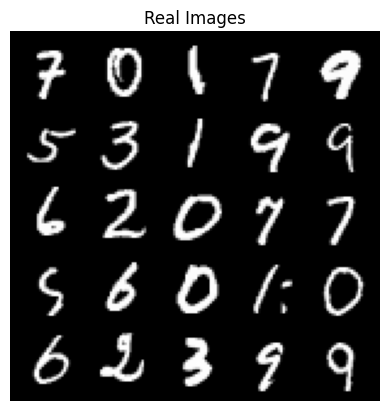

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8000: Generator loss: -5.9897564592659505, critic loss: -14.478553912568087


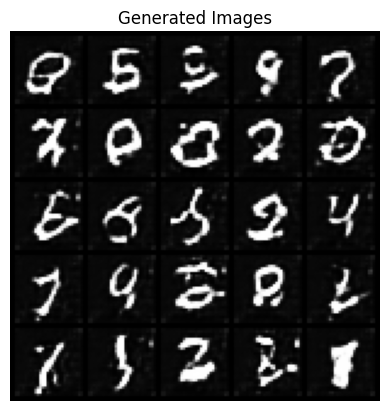

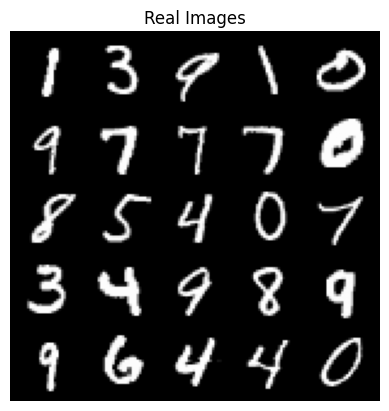

  0%|          | 0/469 [00:00<?, ?it/s]

Step 8500: Generator loss: -5.755800110042092, critic loss: -13.460252903580658


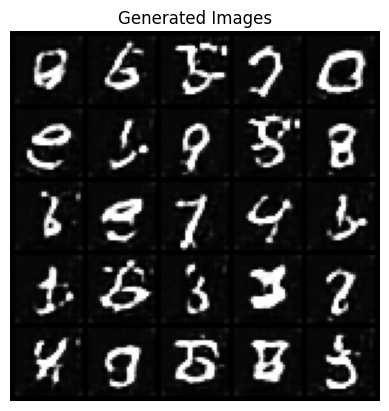

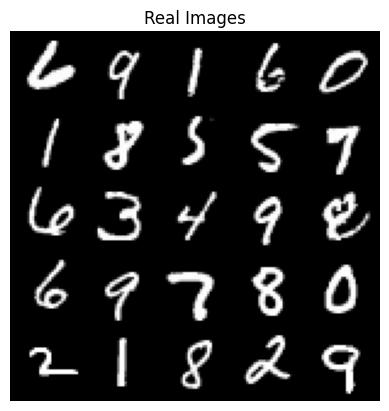

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9000: Generator loss: -6.241731036067003, critic loss: -13.229503917169584


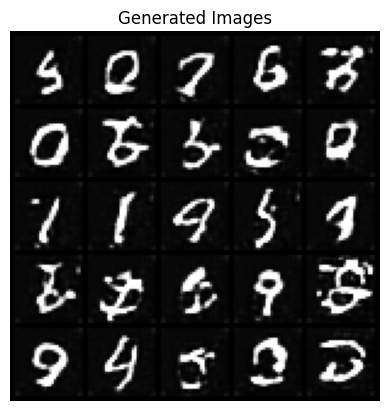

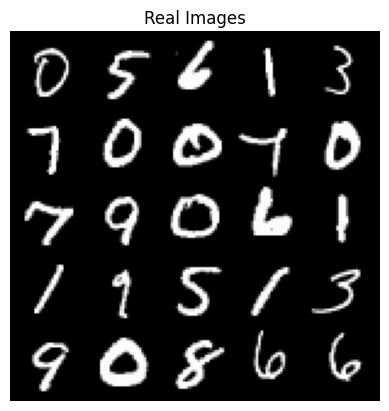

  0%|          | 0/469 [00:00<?, ?it/s]

Step 9500: Generator loss: -7.780484957709917, critic loss: -12.728229050564762


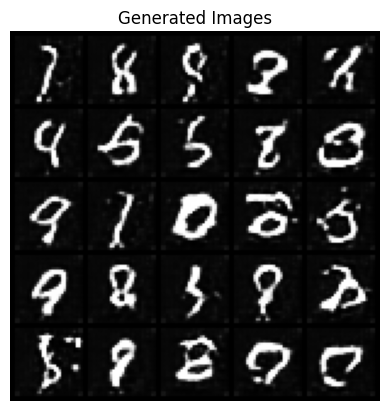

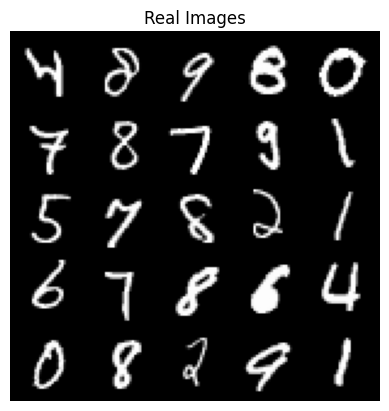

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10000: Generator loss: -6.634930862665175, critic loss: -9.520587872576712


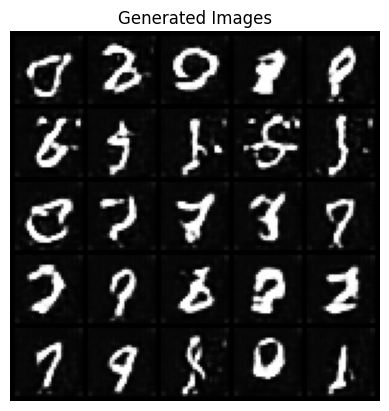

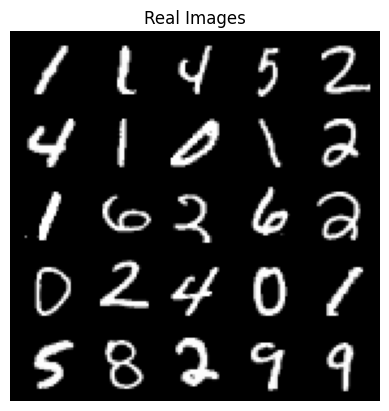

  0%|          | 0/469 [00:00<?, ?it/s]

Step 10500: Generator loss: -9.177484386757017, critic loss: -14.393390106618396


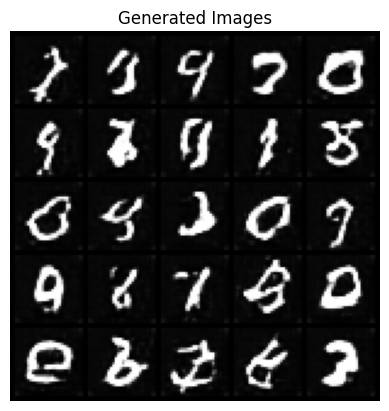

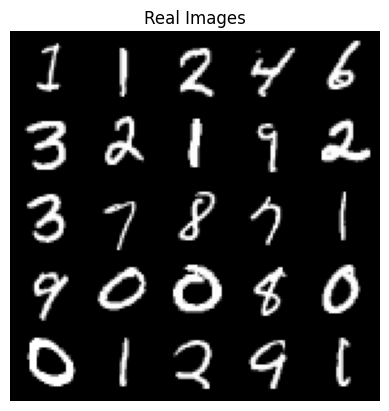

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11000: Generator loss: -8.420300478190187, critic loss: -14.831355067181597


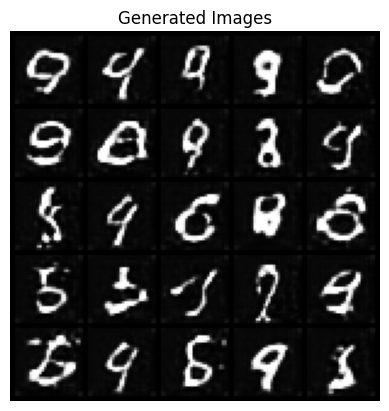

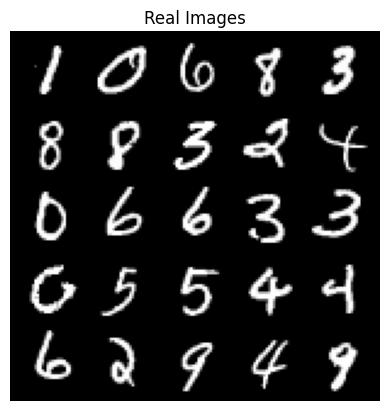

  0%|          | 0/469 [00:00<?, ?it/s]

Step 11500: Generator loss: -8.880153600424526, critic loss: -11.00557864599227


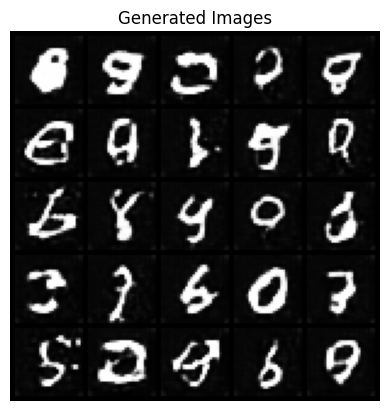

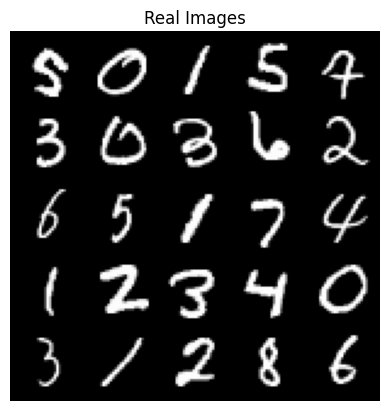

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12000: Generator loss: -7.965220571696767, critic loss: -13.934212579321864


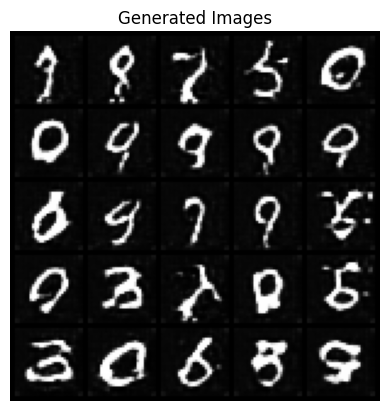

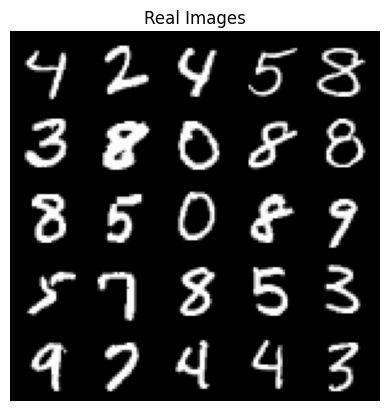

  0%|          | 0/469 [00:00<?, ?it/s]

Step 12500: Generator loss: -6.76865885465592, critic loss: -11.107281028842928


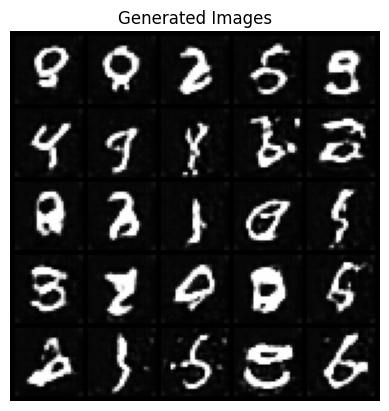

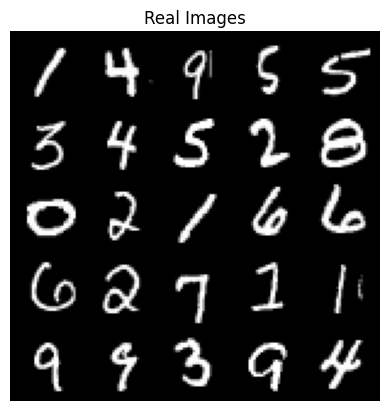

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13000: Generator loss: -7.318345106482506, critic loss: -12.64854542026522


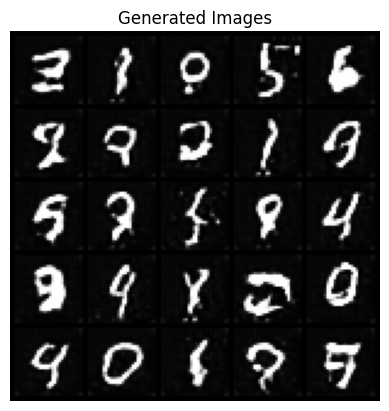

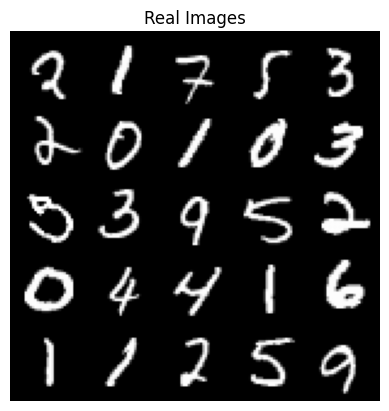

  0%|          | 0/469 [00:00<?, ?it/s]

Step 13500: Generator loss: -3.882727168723941, critic loss: -11.612349825096146


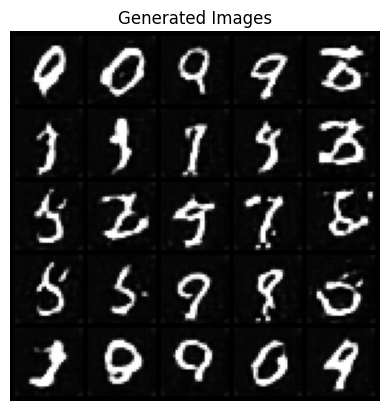

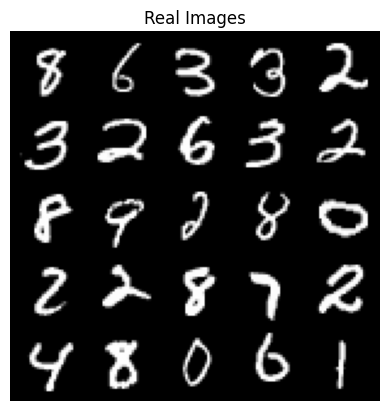

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14000: Generator loss: -4.183368245527151, critic loss: -13.489540588176238


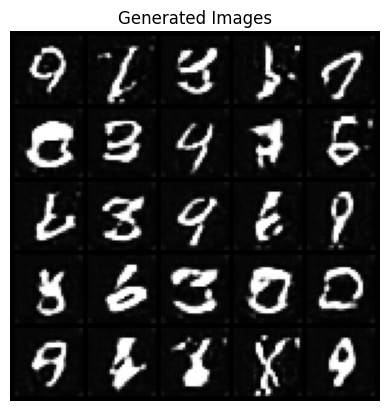

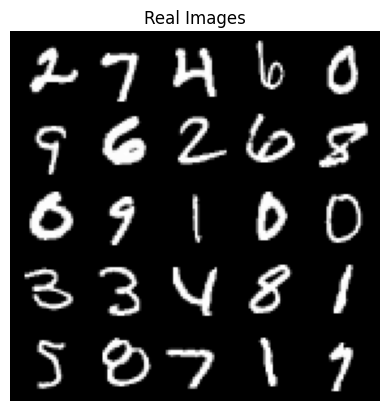

  0%|          | 0/469 [00:00<?, ?it/s]

Step 14500: Generator loss: -1.6465966796576976, critic loss: -13.374374500679977


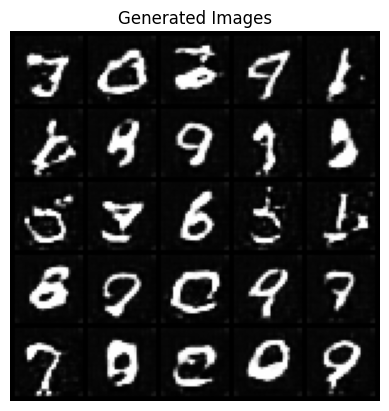

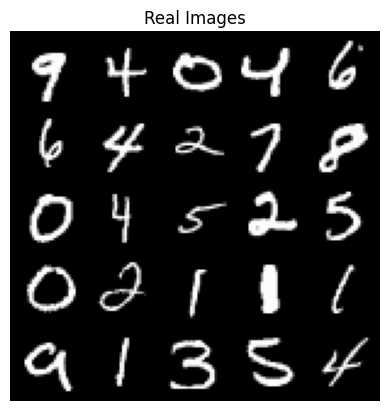

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15000: Generator loss: -0.30697420287132327, critic loss: -12.003226936185351


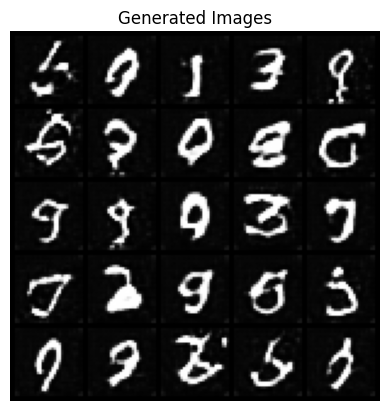

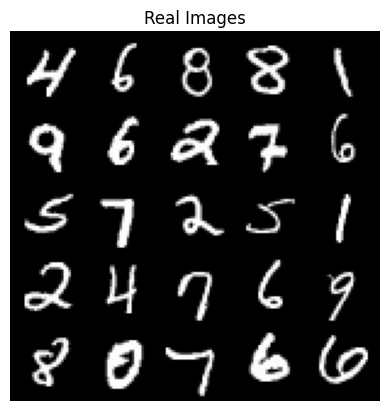

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 15500: Generator loss: 0.44887994068861053, critic loss: -12.437787289369094


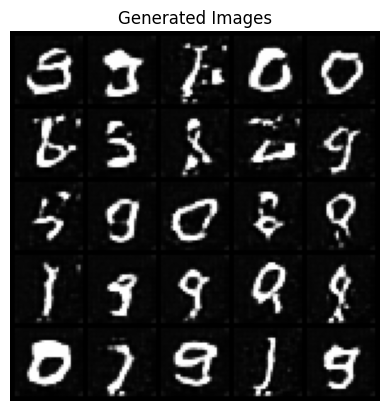

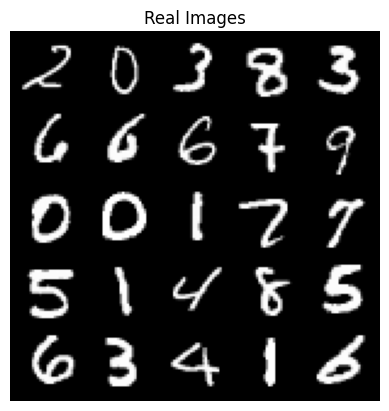

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16000: Generator loss: 3.837530867859719, critic loss: -13.22856841483116


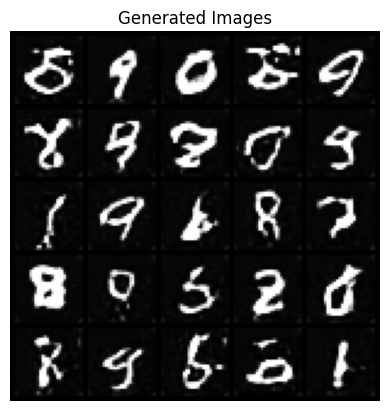

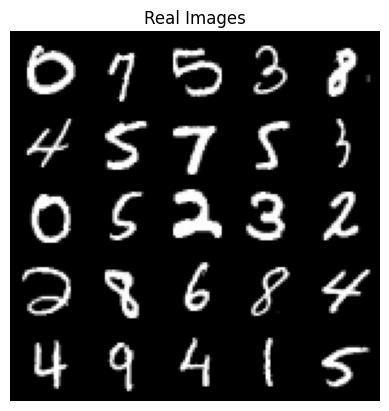

  0%|          | 0/469 [00:00<?, ?it/s]

Step 16500: Generator loss: 3.6660481765270245, critic loss: -16.572504357552532


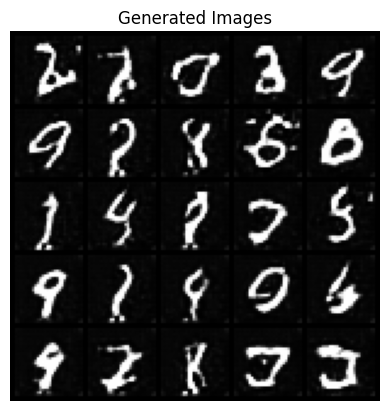

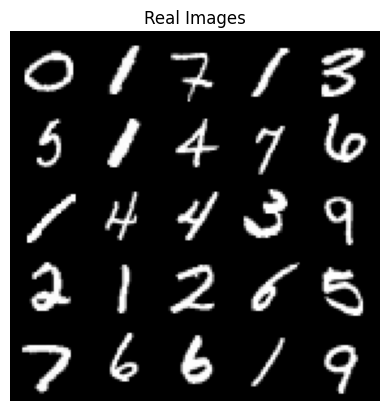

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17000: Generator loss: 10.030128175482146, critic loss: -12.773480040335636


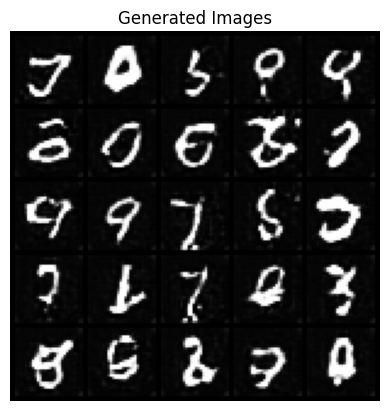

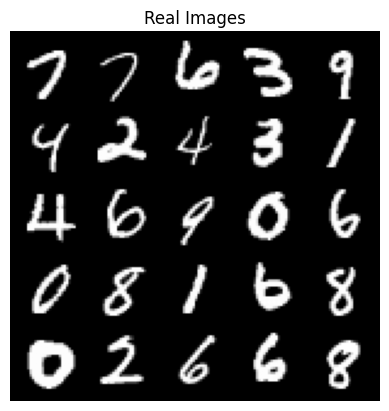

  0%|          | 0/469 [00:00<?, ?it/s]

Step 17500: Generator loss: 11.618936564505095, critic loss: -10.499273579776286


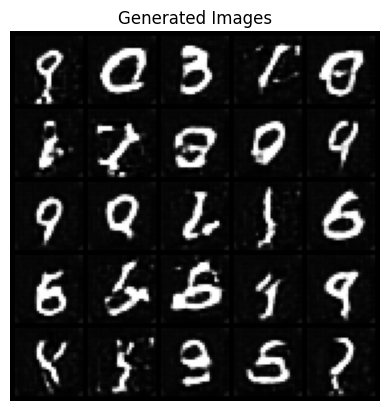

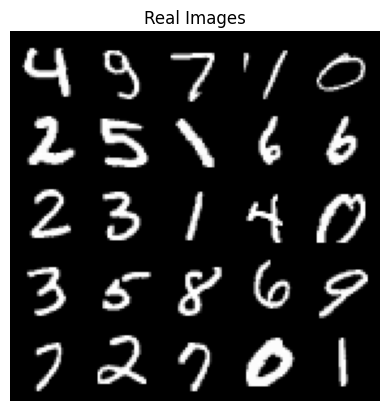

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18000: Generator loss: 12.52064811870455, critic loss: -13.616116969299307


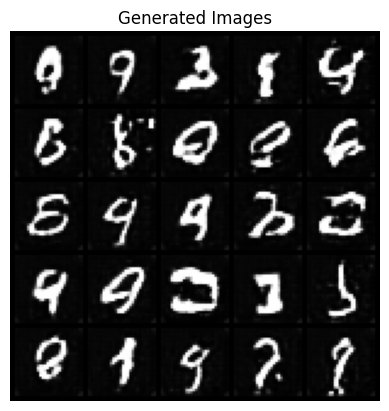

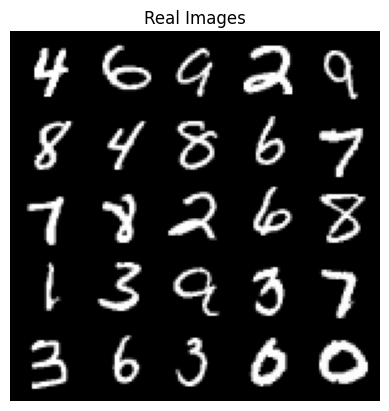

  0%|          | 0/469 [00:00<?, ?it/s]

Step 18500: Generator loss: 14.650351459324357, critic loss: -14.164523177945622


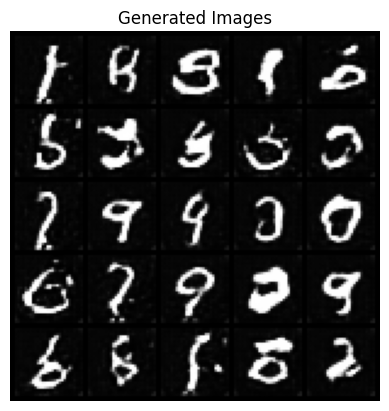

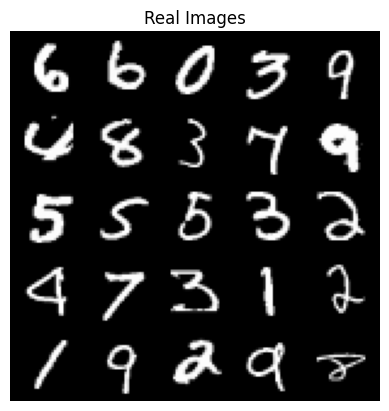

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19000: Generator loss: 17.687915794432165, critic loss: -13.428551239442816


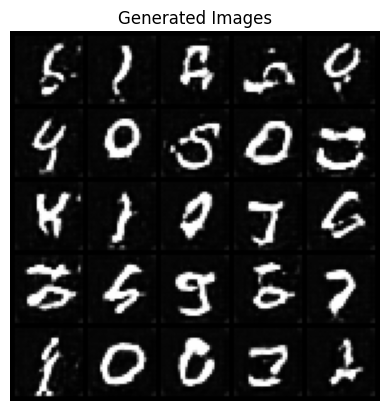

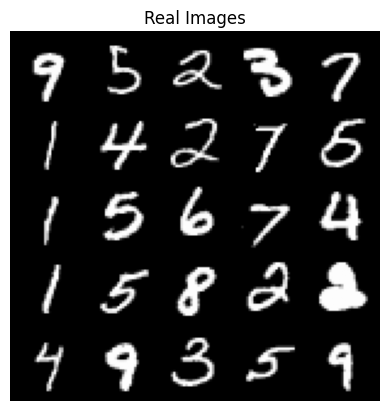

  0%|          | 0/469 [00:00<?, ?it/s]

Step 19500: Generator loss: 20.00059443478287, critic loss: -16.342101487326627


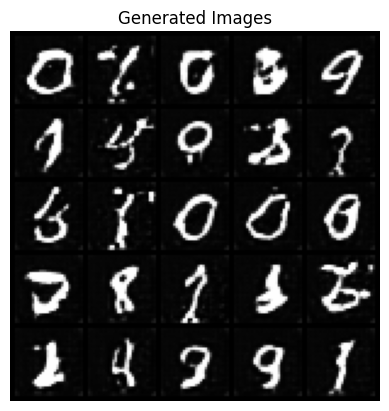

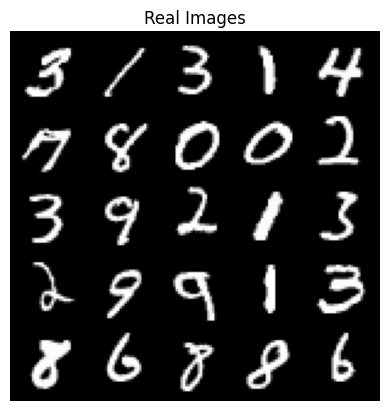

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20000: Generator loss: 21.96770975029468, critic loss: -13.462854970824718


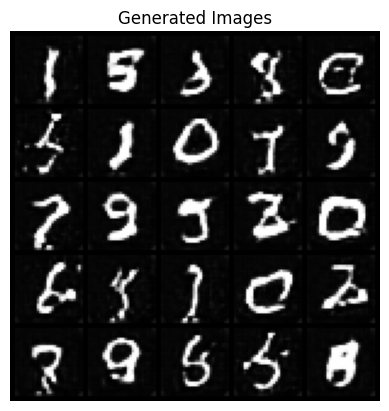

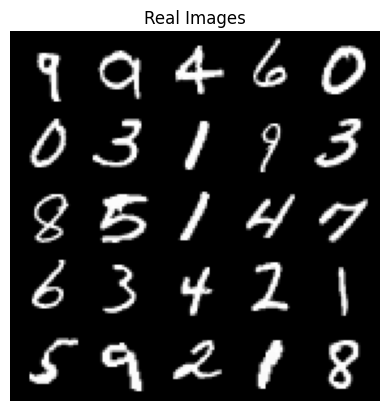

  0%|          | 0/469 [00:00<?, ?it/s]

Step 20500: Generator loss: 26.79237432822582, critic loss: -14.630842287707317


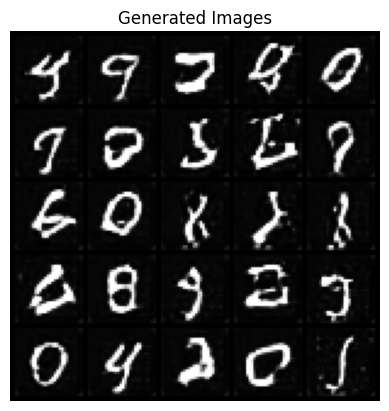

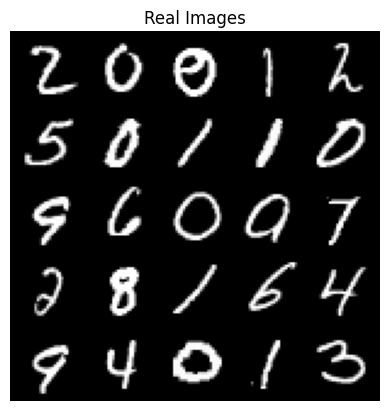

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21000: Generator loss: 31.063974266052217, critic loss: -0.7197054409503937


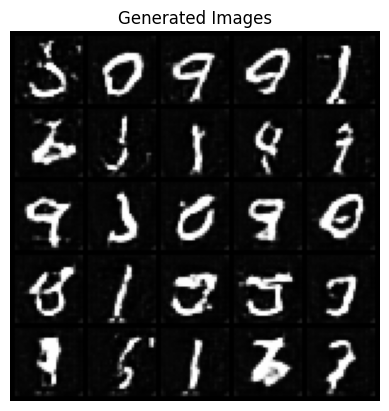

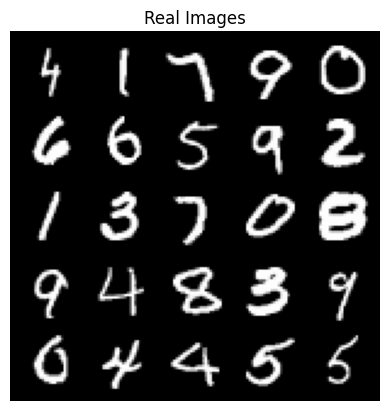

  0%|          | 0/469 [00:00<?, ?it/s]

Step 21500: Generator loss: 35.383438232421916, critic loss: -2.00426586239338


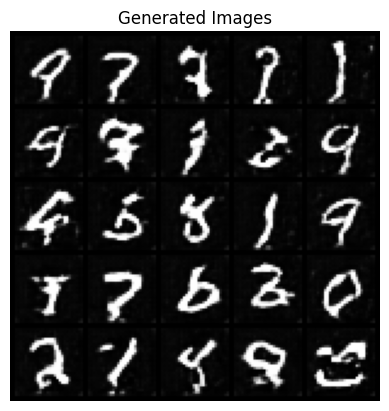

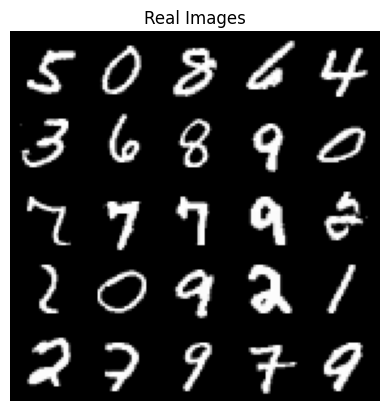

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22000: Generator loss: 36.49055607604975, critic loss: -1.8360808759927771


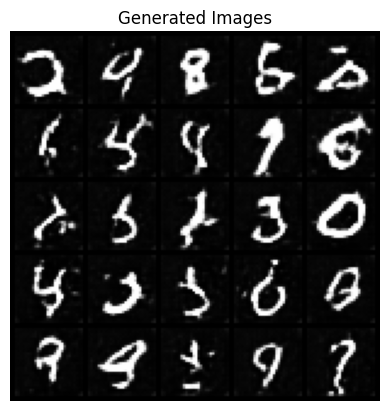

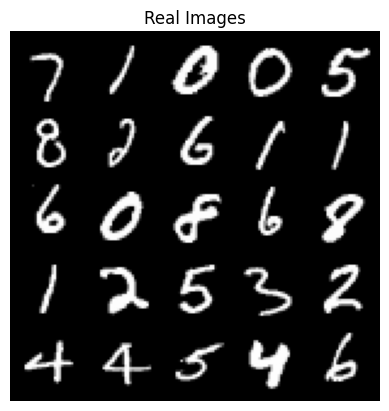

  0%|          | 0/469 [00:00<?, ?it/s]

Step 22500: Generator loss: 38.15648509979247, critic loss: -2.1997028984189018


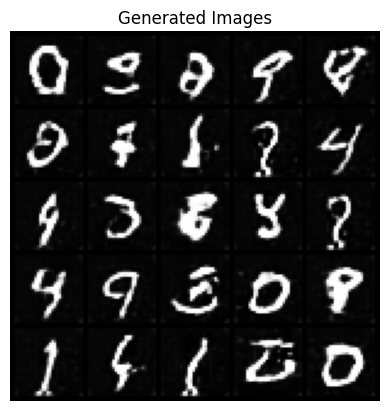

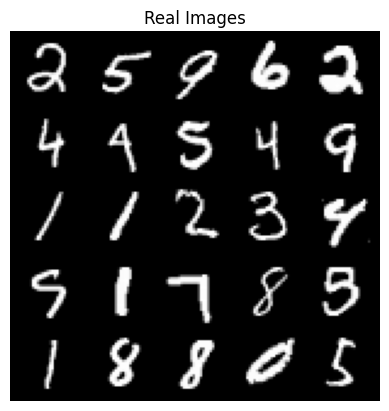

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23000: Generator loss: 39.48006581878663, critic loss: -2.1892371386170355


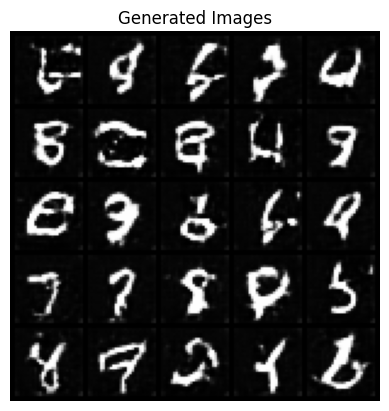

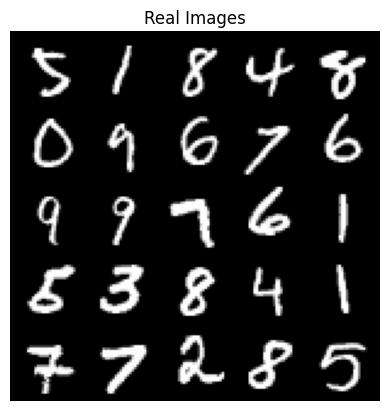

  0%|          | 0/469 [00:00<?, ?it/s]

Step 23500: Generator loss: 38.78185587310795, critic loss: -1.907028612411021


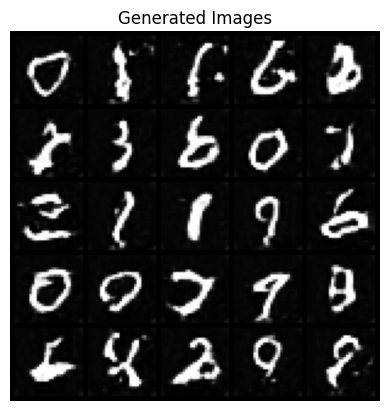

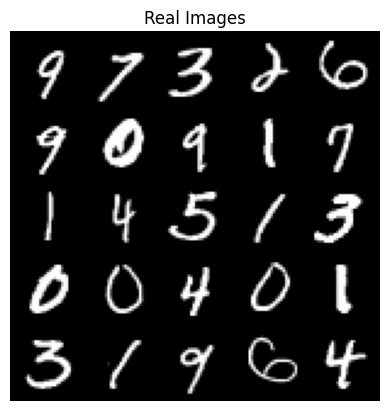

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24000: Generator loss: 41.16263392639162, critic loss: -2.963105914342404


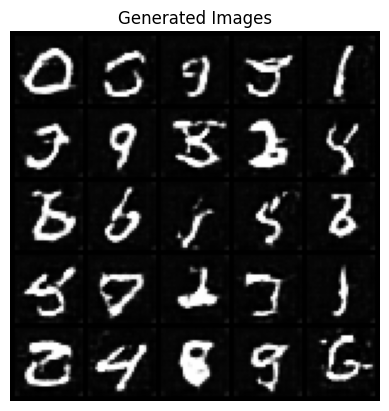

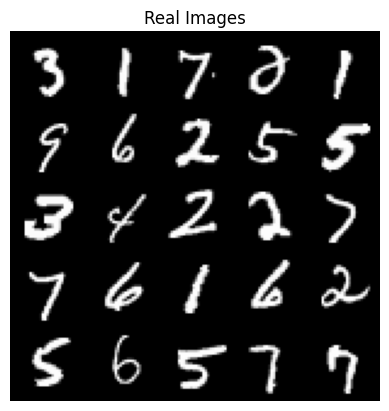

  0%|          | 0/469 [00:00<?, ?it/s]

Step 24500: Generator loss: 39.381270141601526, critic loss: -3.36249656100273


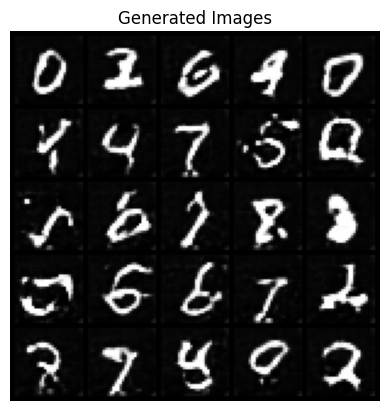

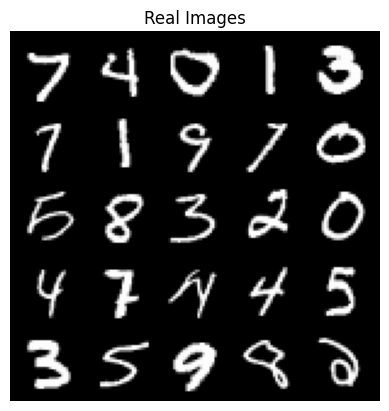

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25000: Generator loss: 39.82288799285886, critic loss: -2.605707741487028


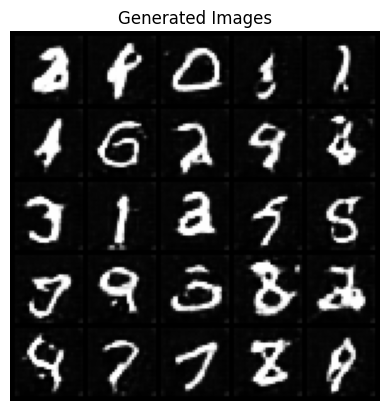

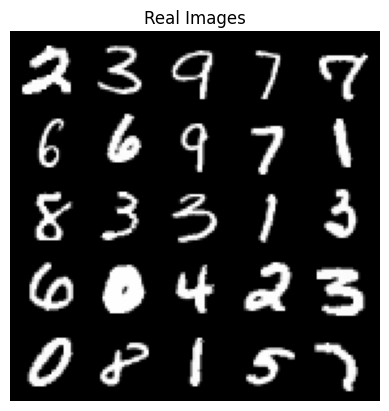

  0%|          | 0/469 [00:00<?, ?it/s]

Step 25500: Generator loss: 40.086631095886226, critic loss: -3.4064045151859523


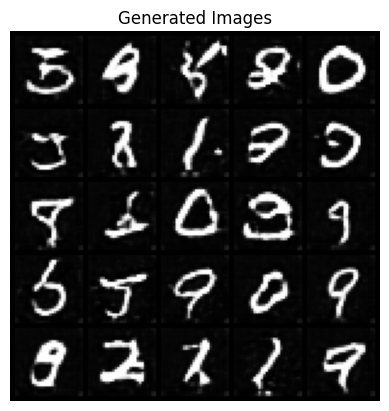

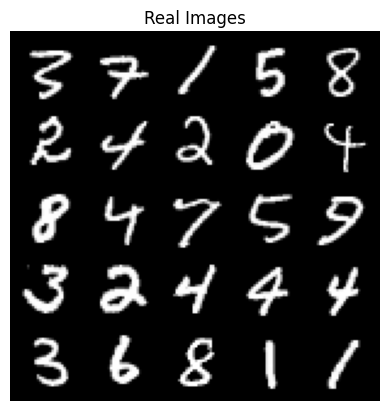

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26000: Generator loss: 40.32335840606691, critic loss: -3.8479900849640396


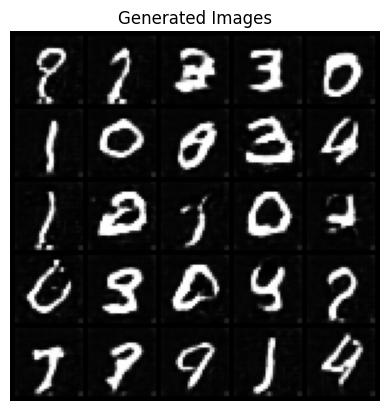

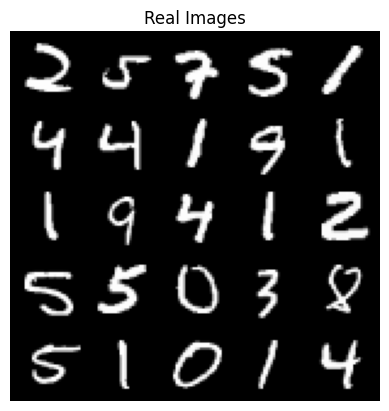

  0%|          | 0/469 [00:00<?, ?it/s]

Step 26500: Generator loss: 39.981375995636, critic loss: -4.281472795301673


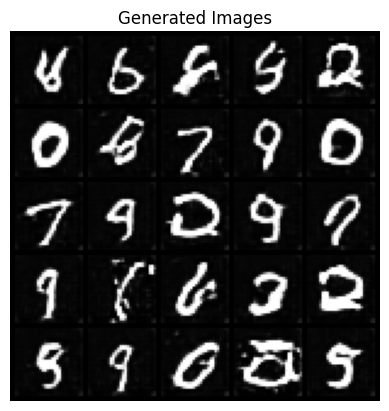

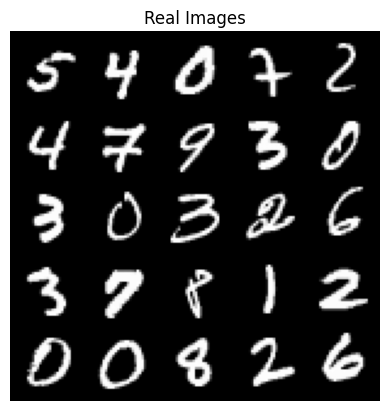

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27000: Generator loss: 38.4022813568115, critic loss: -4.7192563174367015


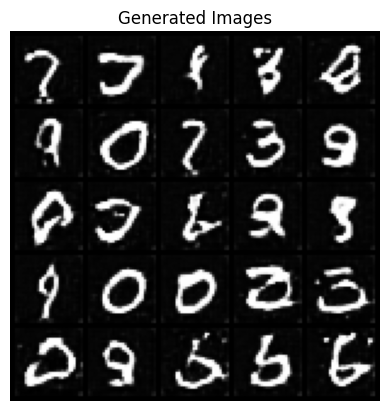

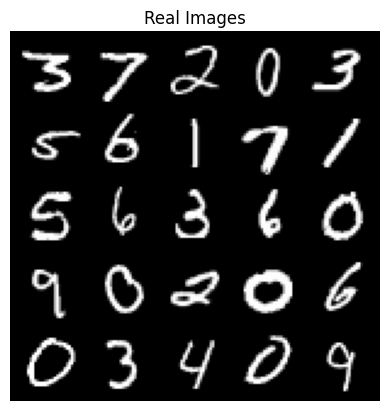

  0%|          | 0/469 [00:00<?, ?it/s]

Step 27500: Generator loss: 38.94321523666379, critic loss: -4.641133171010019


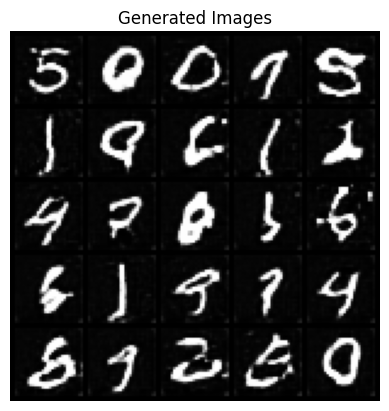

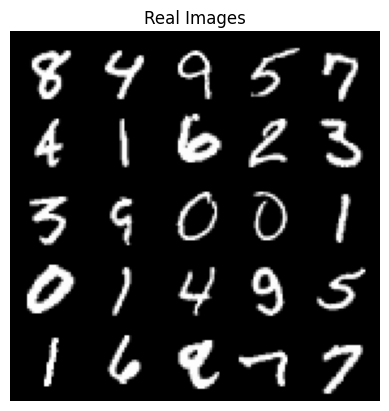

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28000: Generator loss: 40.184254604339564, critic loss: -5.508619864380361


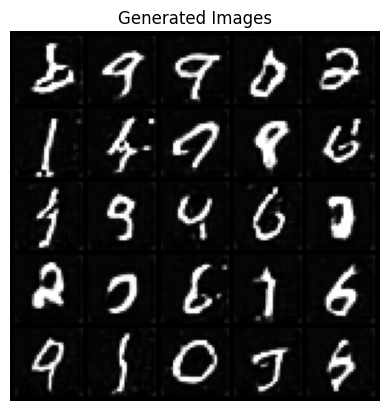

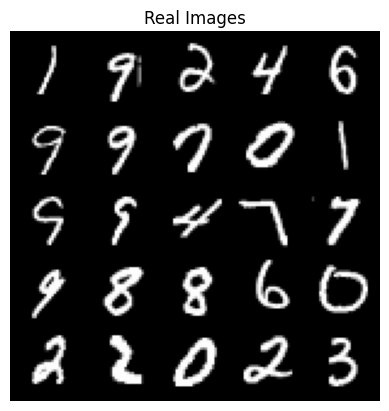

  0%|          | 0/469 [00:00<?, ?it/s]

Step 28500: Generator loss: 42.2317066345215, critic loss: -5.143773796695466


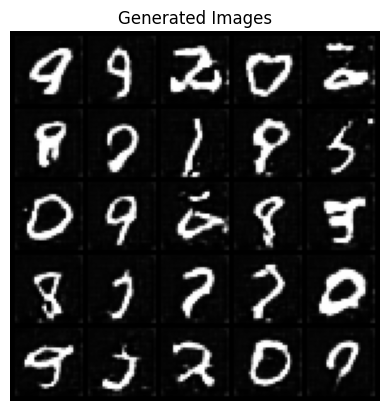

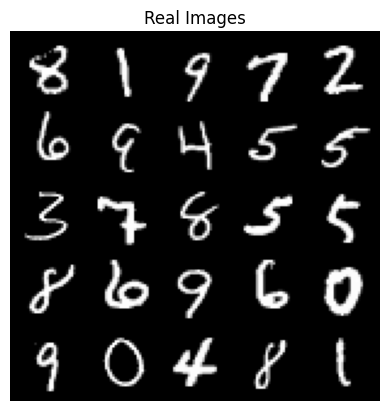

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29000: Generator loss: 42.9553146133423, critic loss: -6.207090401101114


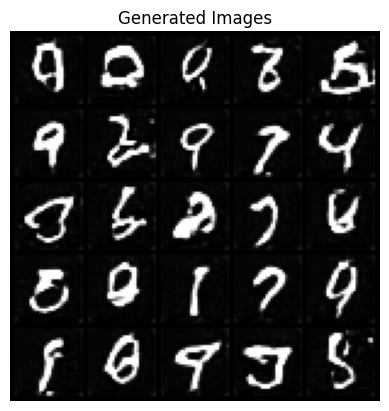

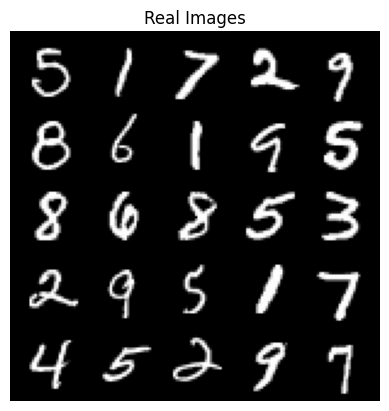

  0%|          | 0/469 [00:00<?, ?it/s]

Step 29500: Generator loss: 44.5285700492859, critic loss: -5.904161470162865


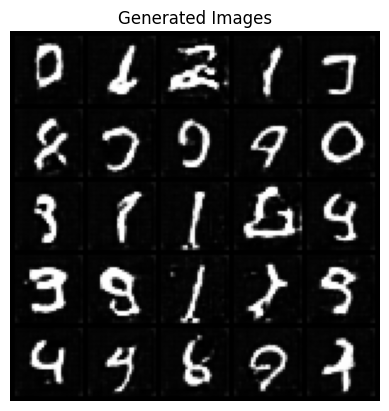

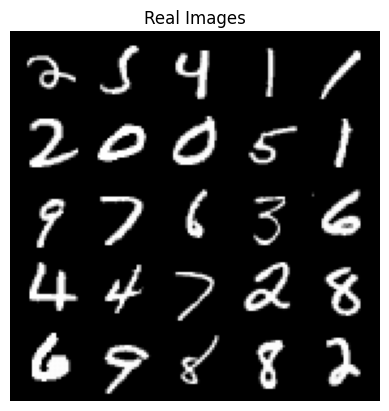

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30000: Generator loss: 43.65839325714108, critic loss: -6.096879584670064


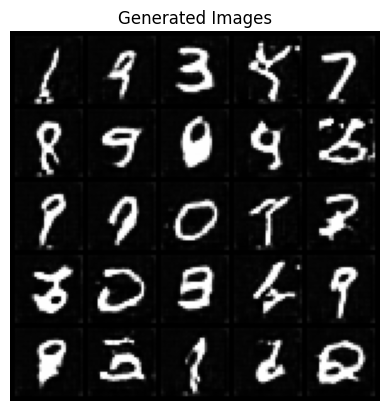

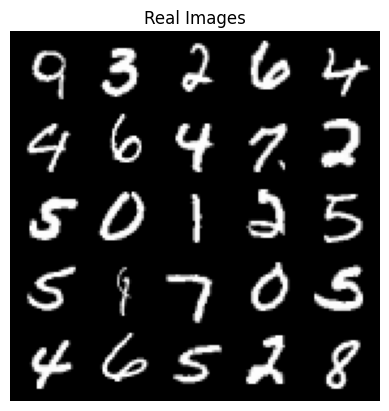

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 30500: Generator loss: 43.53612589263918, critic loss: -7.108889417701962


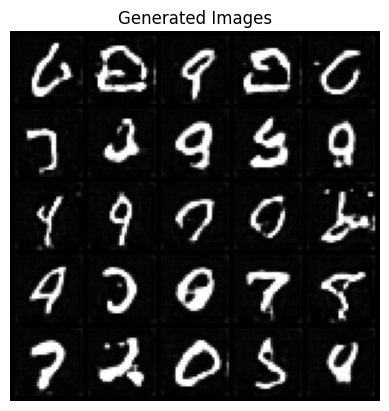

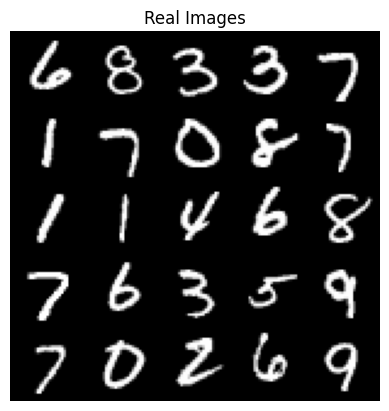

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31000: Generator loss: 45.21348415756222, critic loss: -7.104620789372914


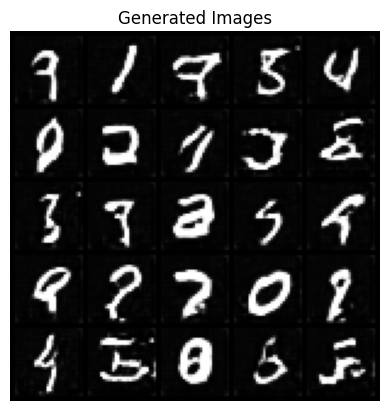

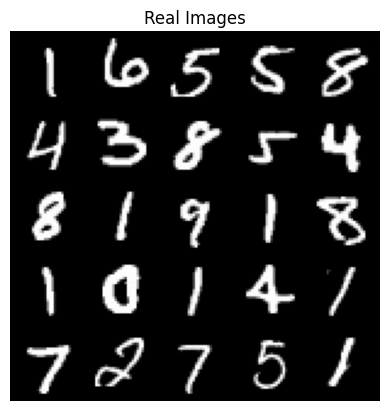

  0%|          | 0/469 [00:00<?, ?it/s]

Step 31500: Generator loss: 45.68729547119139, critic loss: -7.211408364164832


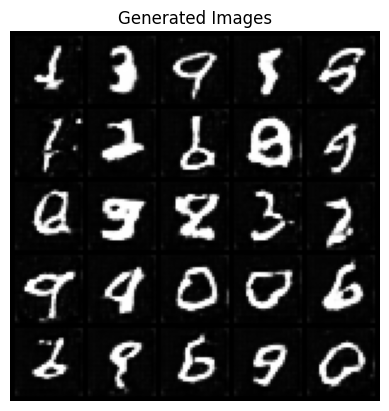

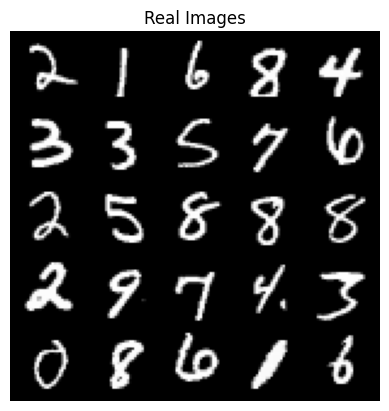

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32000: Generator loss: 47.26909745788574, critic loss: -7.374261087805031


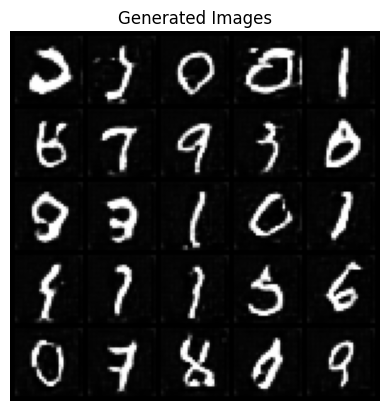

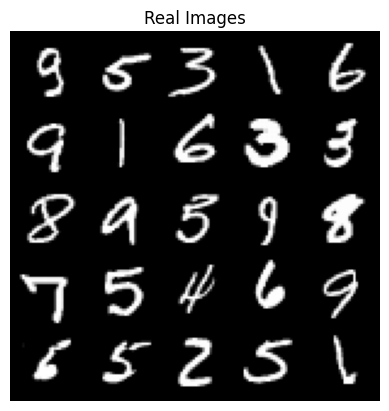

  0%|          | 0/469 [00:00<?, ?it/s]

Step 32500: Generator loss: 47.14074408721919, critic loss: -8.828772344493869


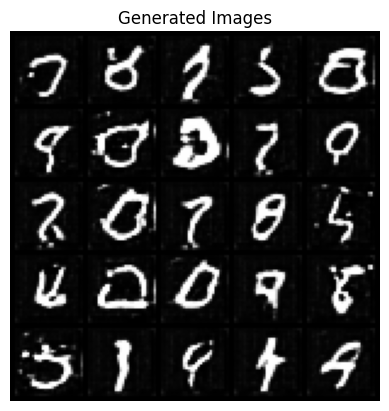

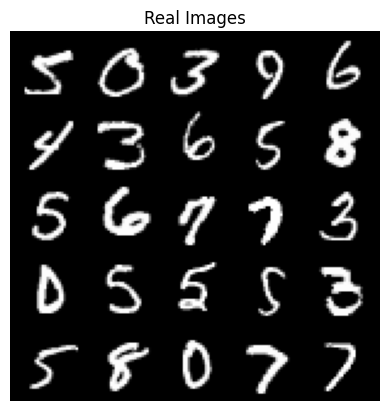

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33000: Generator loss: 46.84909163665768, critic loss: -7.983421350443365


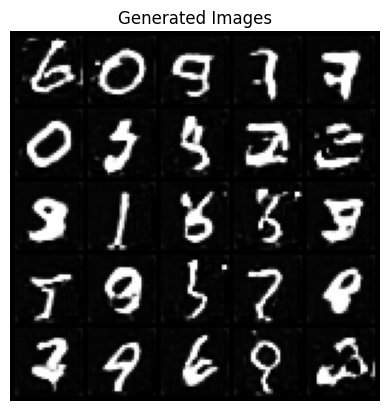

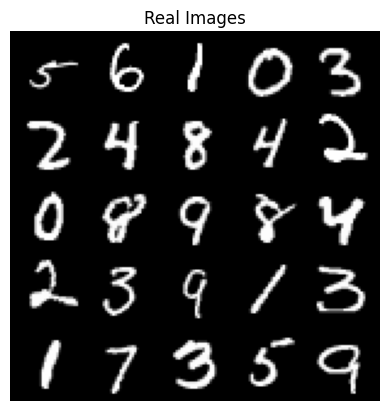

  0%|          | 0/469 [00:00<?, ?it/s]

Step 33500: Generator loss: 49.45318138122553, critic loss: -8.213652508062125


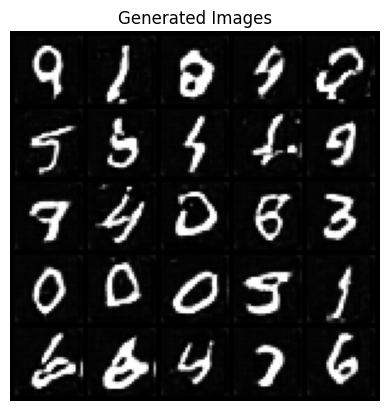

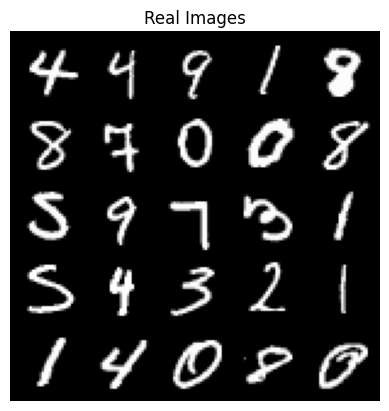

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34000: Generator loss: 50.72727058792113, critic loss: -7.961353058964017


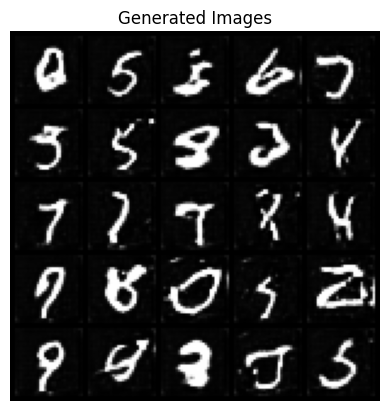

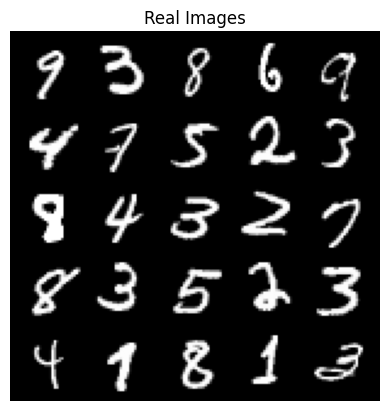

  0%|          | 0/469 [00:00<?, ?it/s]

Step 34500: Generator loss: 52.00726455307008, critic loss: -8.946447287023059


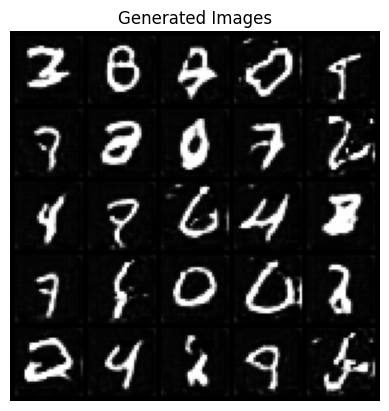

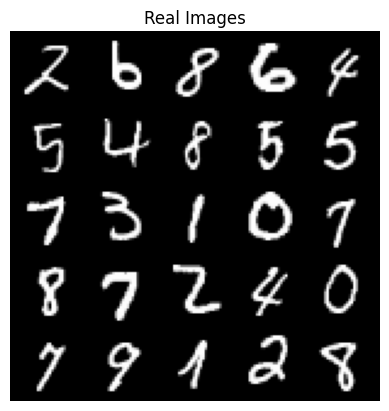

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35000: Generator loss: 53.177691143035894, critic loss: -8.241854802423719


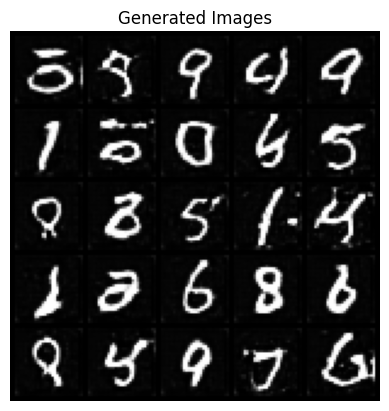

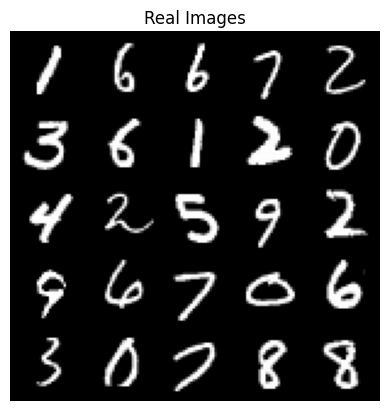

  0%|          | 0/469 [00:00<?, ?it/s]

Step 35500: Generator loss: 51.44724190139779, critic loss: -9.986041921472554


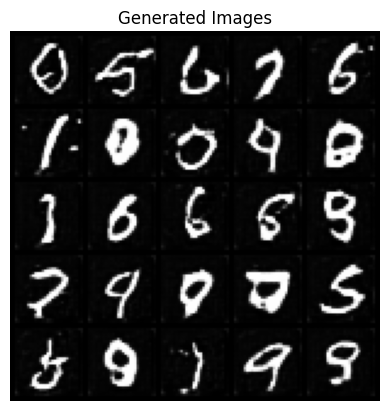

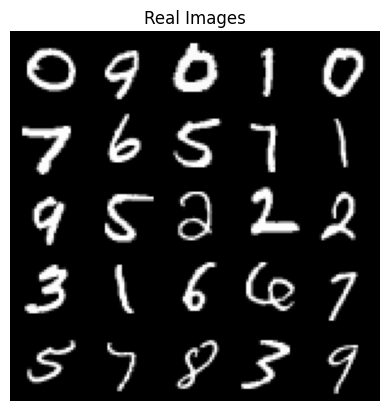

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36000: Generator loss: 47.90321234893796, critic loss: -9.203945625901222


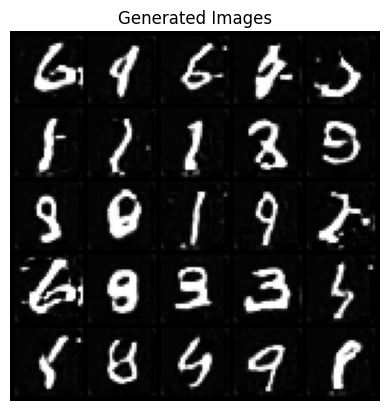

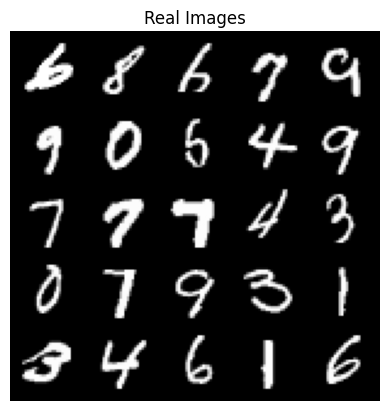

  0%|          | 0/469 [00:00<?, ?it/s]

Step 36500: Generator loss: 49.953397354125975, critic loss: -8.568890971451994


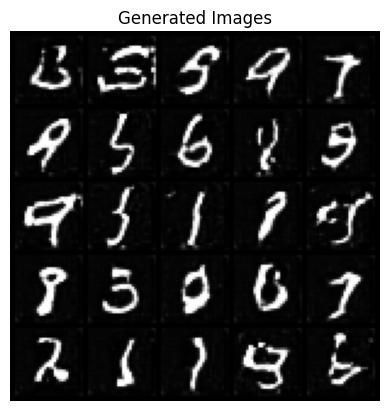

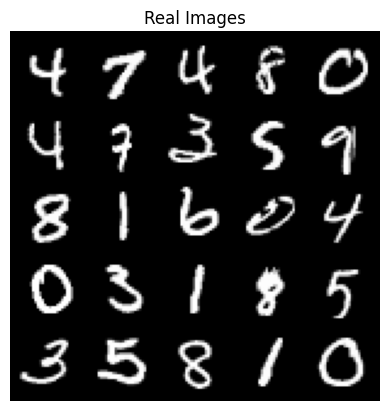

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37000: Generator loss: 49.0510269813537, critic loss: -8.224927799788125


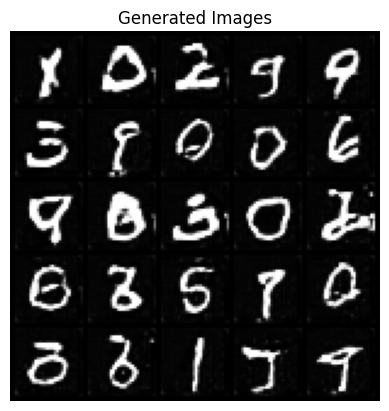

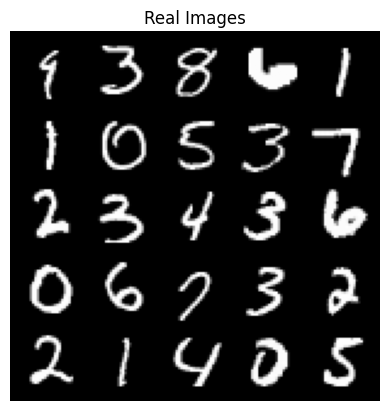

  0%|          | 0/469 [00:00<?, ?it/s]

Step 37500: Generator loss: 47.35838755989071, critic loss: -10.317038054609302


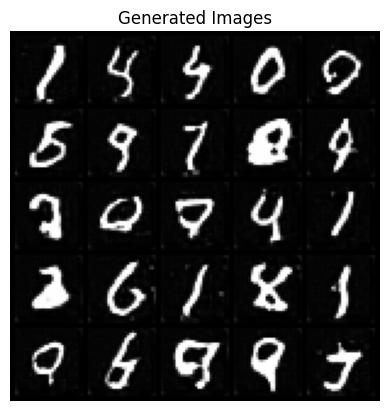

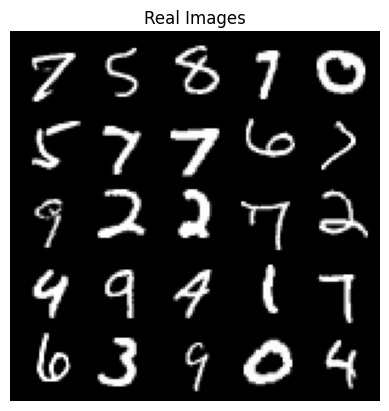

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38000: Generator loss: 47.890412338256866, critic loss: -10.291660269528617


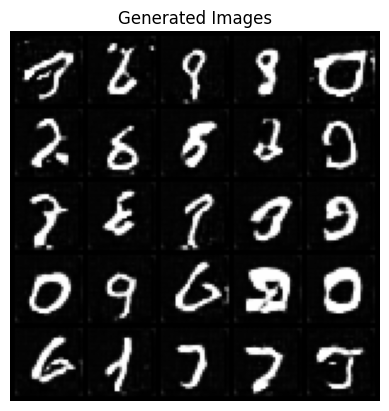

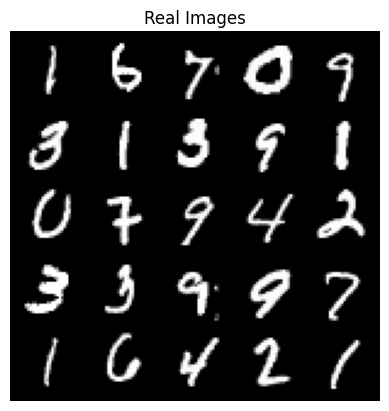

  0%|          | 0/469 [00:00<?, ?it/s]

Step 38500: Generator loss: 45.637758071899384, critic loss: -9.094602762758742


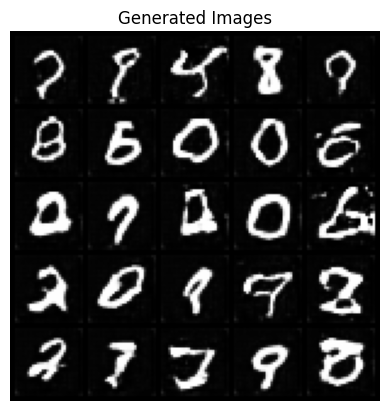

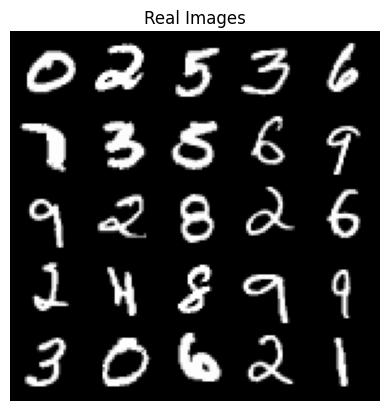

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39000: Generator loss: 45.19169087505338, critic loss: -11.102872641777997


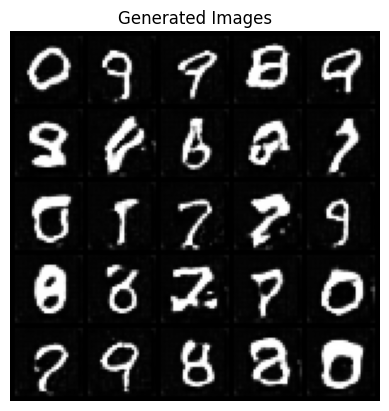

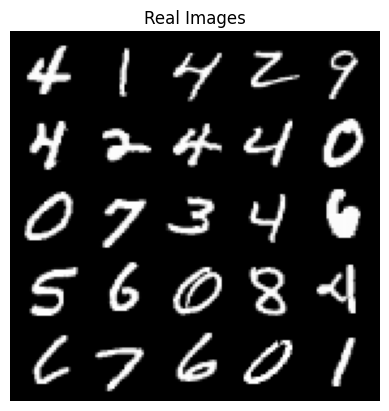

  0%|          | 0/469 [00:00<?, ?it/s]

Step 39500: Generator loss: 43.061266823172524, critic loss: -8.214247930508858


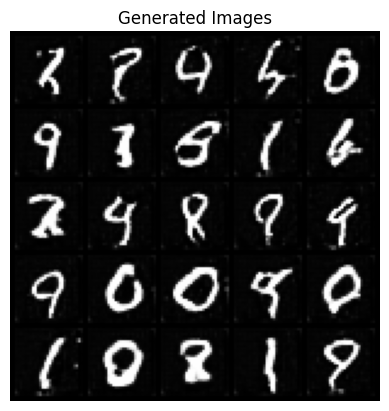

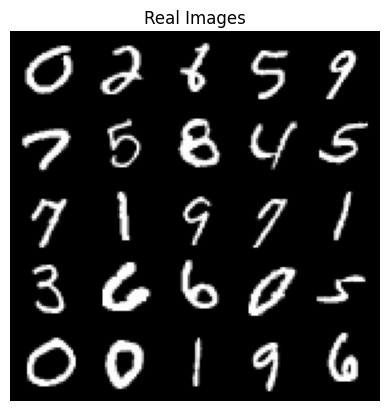

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40000: Generator loss: 38.39215699481962, critic loss: -13.320225281238557


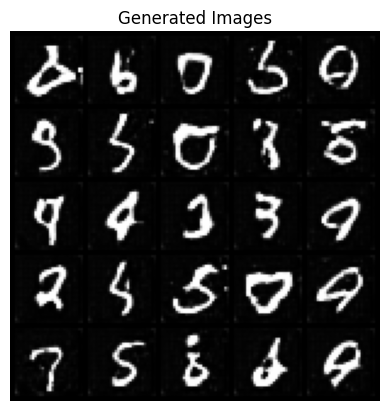

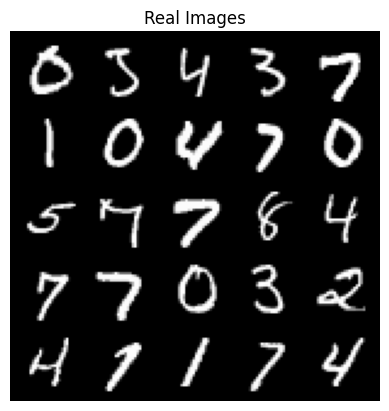

  0%|          | 0/469 [00:00<?, ?it/s]

Step 40500: Generator loss: 35.820012696325755, critic loss: -7.709994626873733


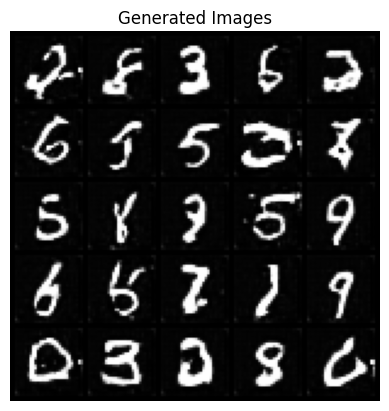

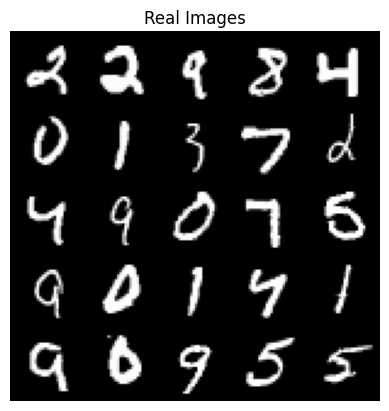

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41000: Generator loss: 34.66314923611284, critic loss: -11.055073786491153


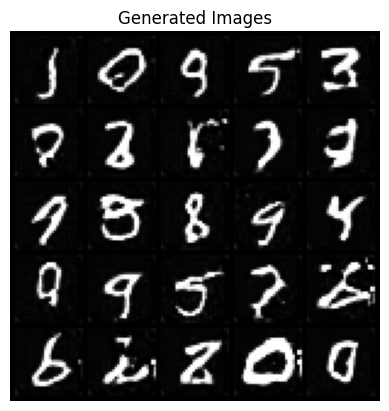

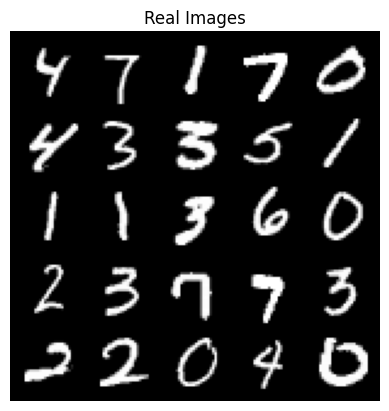

  0%|          | 0/469 [00:00<?, ?it/s]

Step 41500: Generator loss: 32.98962265610694, critic loss: -9.196515215378989


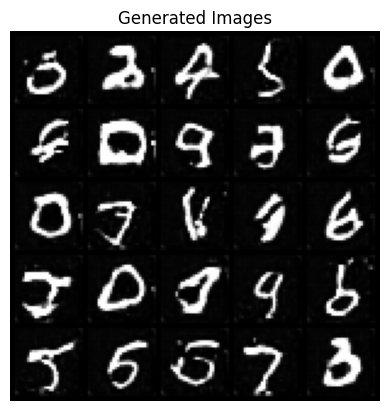

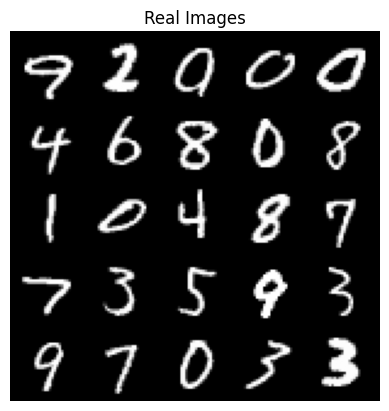

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42000: Generator loss: 30.959236295938474, critic loss: -9.270921075093748


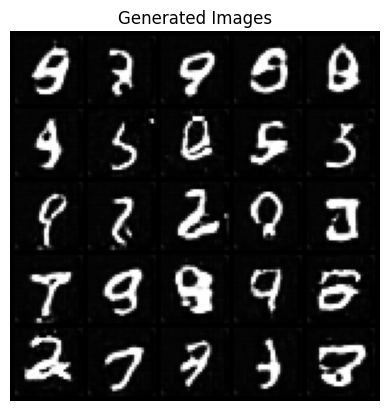

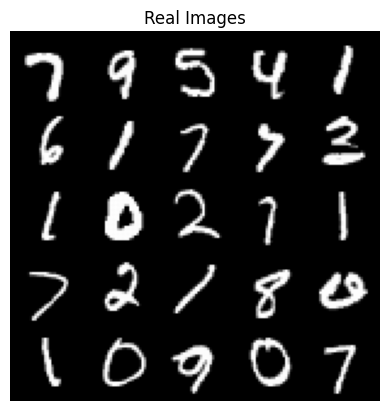

  0%|          | 0/469 [00:00<?, ?it/s]

Step 42500: Generator loss: 28.42532867044213, critic loss: -8.293294017034773


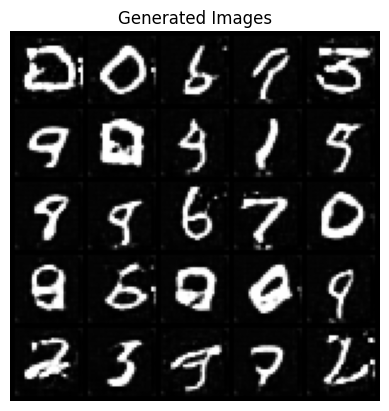

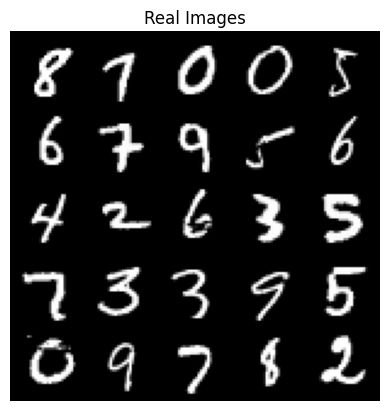

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43000: Generator loss: 26.47531390666964, critic loss: -10.334155540204044


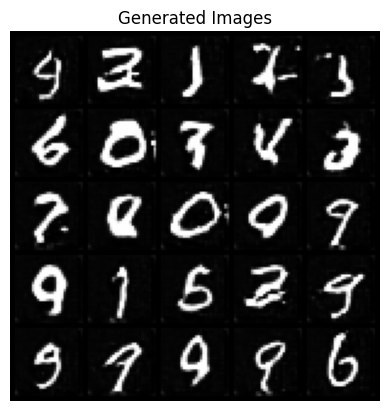

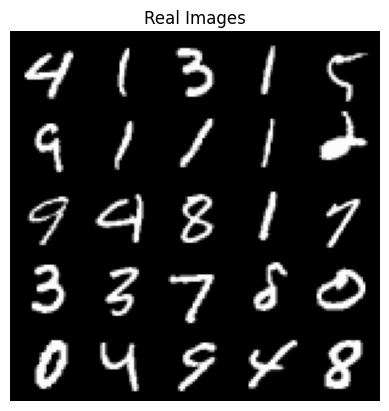

  0%|          | 0/469 [00:00<?, ?it/s]

Step 43500: Generator loss: 24.603129530668248, critic loss: -10.171820958340165


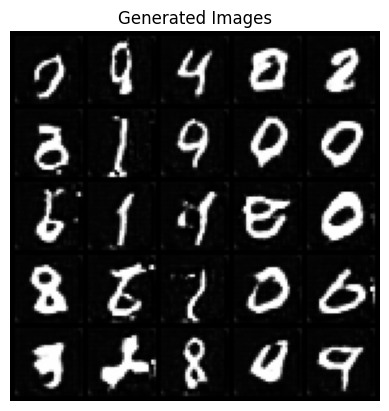

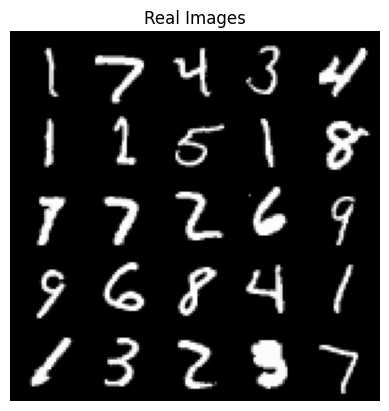

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44000: Generator loss: 21.945277641952032, critic loss: -9.293271554726358


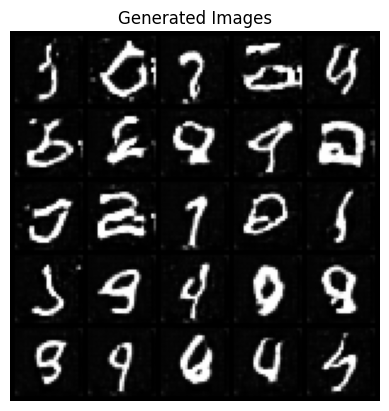

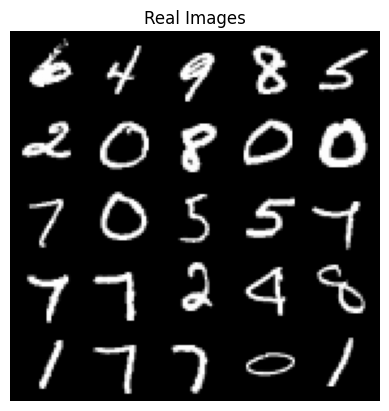

  0%|          | 0/469 [00:00<?, ?it/s]

Step 44500: Generator loss: 20.047215380728257, critic loss: -9.266849259281157


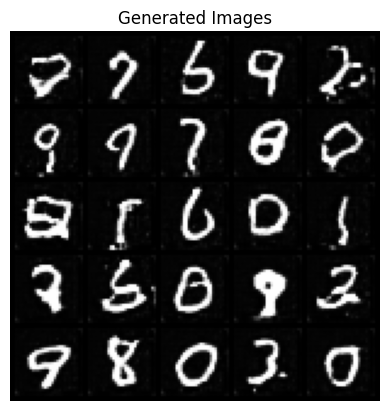

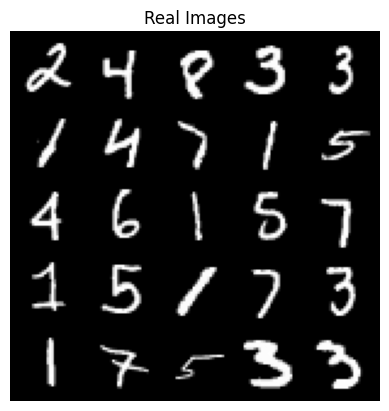

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45000: Generator loss: 20.65719964793324, critic loss: -9.57365205742121


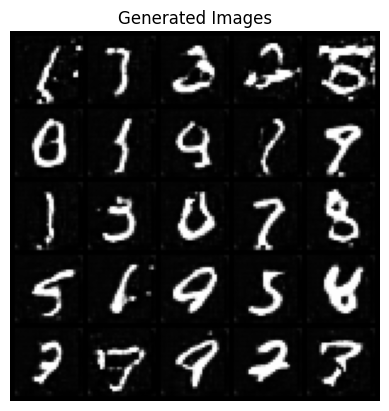

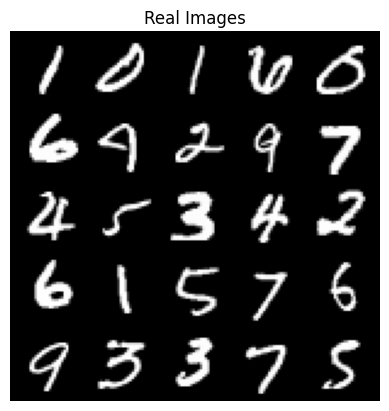

  0%|          | 0/469 [00:00<?, ?it/s]

  0%|          | 0/469 [00:00<?, ?it/s]

Step 45500: Generator loss: 18.939226532161257, critic loss: -11.398755673575398


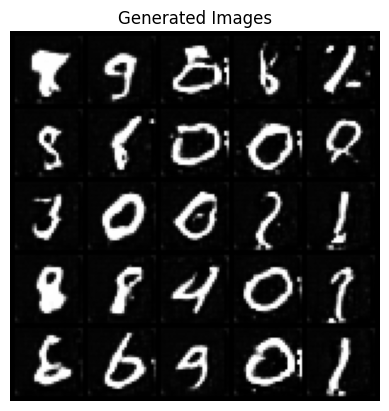

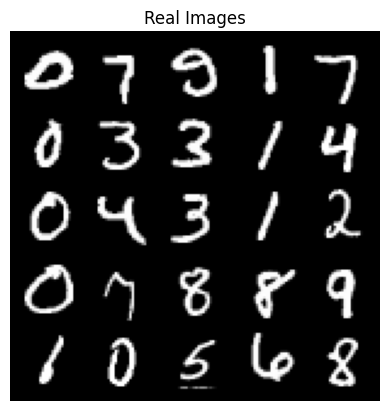

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46000: Generator loss: 14.498698377251626, critic loss: -10.088463557362553


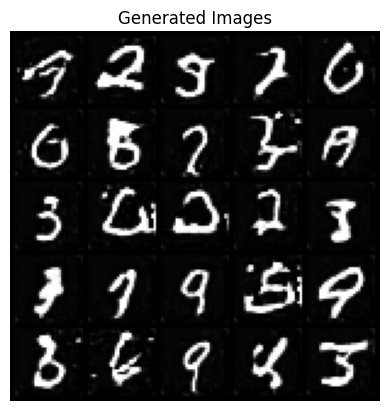

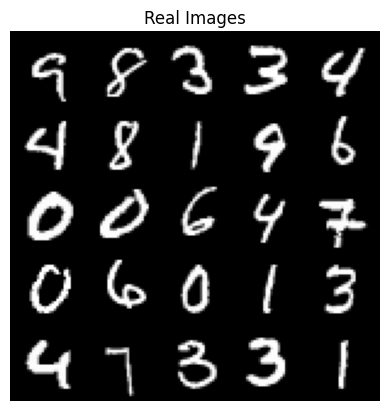

  0%|          | 0/469 [00:00<?, ?it/s]

Step 46500: Generator loss: 13.333202009528875, critic loss: -12.79147823169231


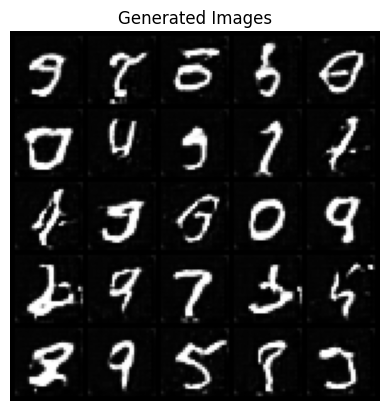

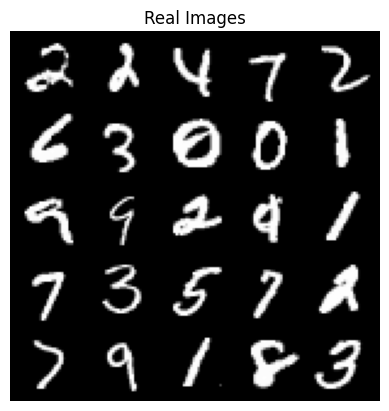

In [13]:
cur_step = 0  # Initialize step count
mean_generator_loss = 0  # Initialize mean generator loss
mean_critic_loss = 0  # Initialize mean critic loss

# Loop through training epochs
for epoch in range(n_epochs):
    # Dataloader returns batches of real images
    for real, _ in tqdm(dataloader):
        cur_batch_size = len(real)
        real = real.to(device)

        # Track the average critic loss for each iteration within an batch
        mean_iteration_critic_loss = 0
        
        # Update critic multiple times before updating the generator
        for _ in range(crit_repeats):
            # Update critic
            crit_opt.zero_grad()
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)
            crit_fake_pred = crit(fake.detach())
            crit_real_pred = crit(real)

            # Calculate gradient penalty and critic loss
            epsilon = torch.rand(len(real), 1, 1, 1, device=device, requires_grad=True)
            gradient = get_gradient(crit, real, fake.detach(), epsilon)
            gp = gradient_penalty(gradient)
            crit_loss = get_crit_loss(crit_fake_pred, crit_real_pred, gp, c_lambda)

            # Track the average critic loss in this batch
            mean_iteration_critic_loss += crit_loss.item() / crit_repeats
            # Update gradients
            crit_loss.backward(retain_graph=True)
            # Update optimizer
            crit_opt.step()

        ### Update generator ###
        gen_opt.zero_grad()
        fake_noise_2 = get_noise(cur_batch_size, z_dim, device=device)
        fake_2 = gen(fake_noise_2)
        crit_fake_pred = crit(fake_2)
        
        # Calculate generator loss
        gen_loss = get_gen_loss(crit_fake_pred)
        gen_loss.backward()

        # Update generator weights
        gen_opt.step()
        
        # Keep track of the average generator loss
        mean_generator_loss += gen_loss.item() / display_step
        # Keep track of the average discriminator loss
        mean_critic_loss += mean_iteration_critic_loss / display_step

        # Visualization code - display generated and real images
        if cur_step % display_step == 0 and cur_step > 0:
            print(f"Step {cur_step}: Generator loss: {mean_generator_loss}, critic loss: {mean_critic_loss}")

            # Generate fake images
            fake_noise = get_noise(cur_batch_size, z_dim, device=device)
            fake = gen(fake_noise)

            # Display generated images
            show_tensor_images(fake, generated=True)

            # Display real images
            show_tensor_images(real)

            # Reset average losses for the next display
            mean_generator_loss = 0
            mean_critic_loss = 0
            
        cur_step += 1